## Fourierova transformace
v modulu scipy

fft(signal)
- převádí signál z časové domény do frekvenční domény
- výstupem spektrum složené z komplexních čísel, která reprezentují amplitudy a fáze jednotlivých frekvencí
  - absolutní hodnota odpovídá amplitudě

ifft
- převádí signál z frekvenční domény zpět do časové domény
- výstupem časový průběh původního signálu

#### Fourierova řada
$$
f(t) =
\frac{a_0}{2}
+
\sum_{n=1}^{\infty}
\left[
a_n \cos\left(\frac{2\pi n}{T} t\right)
+
b_n \sin\left(\frac{2\pi n}{T} t\right)
\right]
=\sum_{n=1}^{\infty}{c_ne^{i\frac{2\pi n}{T}t}}
$$
$$
a_0 = \frac{2}{T} \int_0^T f(t)\,dt
$$
$$
a_n = \frac{2}{T} \int_0^T f(t)\cos\left(\frac{2\pi n}{T} t\right)\,dt
$$
$$
b_n = \frac{2}{T} \int_0^T f(t)\sin\left(\frac{2\pi n}{T} t\right)\,dt
$$
$$
c_{n}={\frac {1}{T}}\int _{0}^{T}{f\left(t\right)\ e^{-in\omega t}dt}
$$
sudá funkce: $
f(−t)=f(t)⇒b_n=0
$
→ jen kosiny

lichá funkce $
f(−t)=−f(t)⇒a_n=0
$
→ jen siny
$$
f(t) =
\frac{4}{\pi}
\sum_{k=0}^{\infty}
\frac{\sin((2k+1)t)}{2k+1}
$$

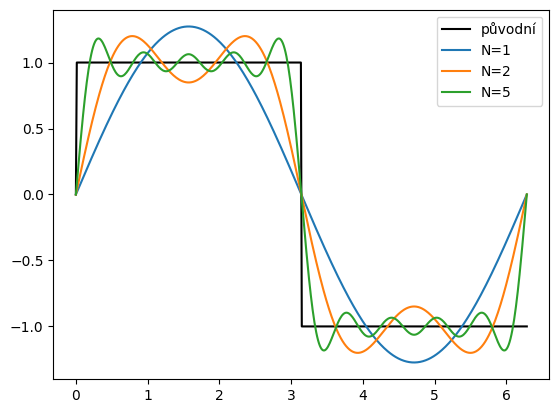

In [82]:
# aproximujme obdélníkový signál součtem sinů
import numpy as np
import matplotlib.pyplot as plt

t = np.linspace(0, 2*np.pi, 500)            # časová řada
f = np.sign(np.sin(t))                      # obdélníkový signál (pomocí signum)

# Fourierova aproximace (např. 5, 15, 50 členů)
def fourier_square(t, N):                   # t vektor časů, N počet členů
    return np.sum([np.sin((2*k+1)*t)/(2*k+1) for k in range(N)], axis=0) * (4/np.pi)

plt.plot(t, f, 'k', label='původní')
for N in [1, 2, 5]:
    plt.plot(t, fourier_square(t, N), label=f'N={N}')
plt.legend(); plt.show()

#### Fourierova transformace
- hledáme frekvence v signálu

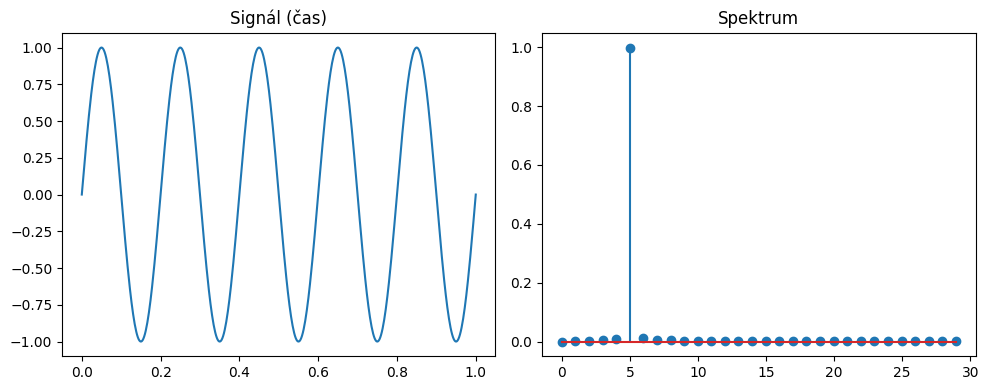

In [83]:
# Sinusoida
import numpy as np
import matplotlib.pyplot as plt

N = 500
t = np.linspace(0, 1, N)
f = 5                                       # 5 Hz
f = np.sin(2*np.pi*f * t)

F = np.fft.fft(f)                           # spočítá DFT, výsledek je komplexní spektrum
freq = np.fft.fftfreq(len(t), t[1]-t[0])    # vytvoří frekvenční osy (délka, krok)
# Normalizace
F = np.abs(F) / (N/2)
#F = np.abs(F[:N//2]) * 2 / N                # odpovídá fyzikální amplitudě

# Zobrazení
plt.figure(figsize=(10,4))

plt.subplot(1,2,1)
plt.plot(t, f)
plt.title("Signál (čas)")

plt.subplot(1,2,2)
plt.stem(freq[:30], np.abs(F)[:30])
#plt.stem(freq, np.abs(F))
plt.title("Spektrum")

plt.tight_layout()
plt.show()

In [84]:
# 1. Sinusoida - vytvoření
import numpy as np
import matplotlib.pyplot as plt

N = 500
t = np.linspace(0, 1, N)
f = 5                                       # 5 Hz
f = np.sin(2*np.pi*f * t)

F = np.fft.fft(f)                           # spočítá DFT, výsledek je komplexní spektrum
freq = range(len(F))

In [85]:
# 2. Vytvoření frekvenčních os
freq = np.fft.fftfreq(len(t), t[1]-t[0])    # vytvoří frekvenční osy (délka, krok)


In [86]:
# 3. Normalizace (měřítko osy y)
F = np.abs(F) / (N/2)                       # kladné i záporné hodnoty frekvencí


In [87]:
# 3. Normalizace
F = np.abs(F[:N//2]) * 2 / N                # odpovídá fyzikální amplitudě (odstraní záporné hodnoty)
freq = freq[:N//2]                          # odpovídající zmenšení osy x

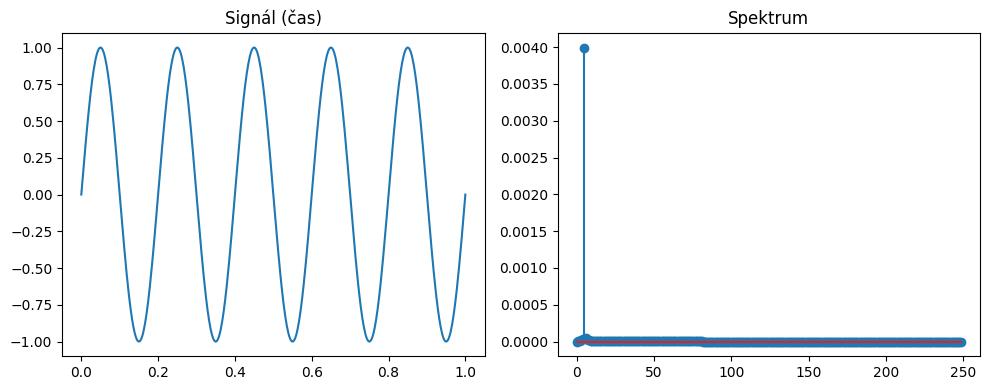

In [88]:
# 4. Zobrazení
plt.figure(figsize=(10,4))

plt.subplot(1,2,1)
plt.plot(t, f)
plt.title("Signál (čas)")

plt.subplot(1,2,2)
#plt.stem(freq[:30], np.abs(F)[:30])
plt.stem(freq, np.abs(F))
plt.title("Spektrum")

plt.tight_layout()
plt.show()

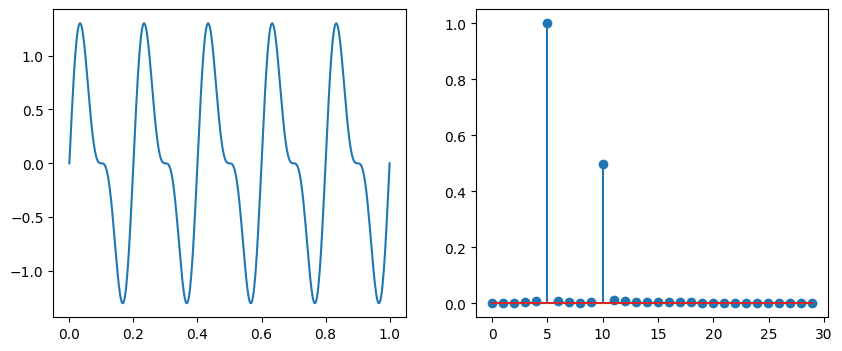

In [89]:
N = 500
t = np.linspace(0, 1, N)

f1 = 5
f2 = 10
f = (
    np.sin(2*np.pi*f1 * t) +
    0.5 * np.sin(2*np.pi*f2 * t)
)

F = np.fft.fft(f)
freq = np.fft.fftfreq(len(t), t[1]-t[0])
F = np.abs(F[:N//2]) * 2 / N                # odpovídá fyzikální amplitudě

plt.figure(figsize=(10,4))

plt.subplot(1,2,1)
plt.plot(t, f)

plt.subplot(1,2,2)
plt.stem(freq[:30], np.abs(F)[:30])

plt.show()

#### Fourierova transformace
- perioda roste do nekonečna
- frekvence už nejsou diskrétní, ale spojité: $\quad    \sum_n \quad \rightarrow \quad \int$
$$
f(t) = \sum_n c_n e^{i \omega_0 n t} = \sum_n c_n e^{i \omega_n t}
$$
$$
c_{n}={\frac {1}{T}}\int _{0}^{T}{f\left(t\right)\ e^{-in\omega_0 t}dt}
=
\frac{1}{T} \int_{-T/2}^{T/2} f(t)\ e^{-i n \omega_0 t}\, dt
$$
Neperiodický signál uvažujeme jako periodický s nekonečnou periodou.

$T \to \infty$, $\ \ \ \omega_0 = \frac{2\pi}{T} \to 0$
$$
%\displaystyle \lim _{T\rightarrow \infty }{Tc_{n}}=\lim _{T\rightarrow \infty }{\int _{-{\frac {T}{2}}}^{\frac {T}{2}}{f\left(t\right)e^{-in\omega t}dt}}=\int _{-\infty }^{\infty }{f\left(t\right)\ e^{-i\omega t}dt}=F\left(\omega \right)
$$

$$
f(t) =\frac{1}{2\pi}
\int_{-\infty}^{\infty}
F(\omega)\, e^{i \omega t}\, d\omega
$$
Dopředná:
$$
F(\omega) =
\int_{-\infty}^{\infty}
f(t)\, e^{-i \omega t}\, dt
$$

Diskrétní Fourierova transformace
- neperiodický signál → spojité spektrum
- Gaussova funkce → Gaussova funkce

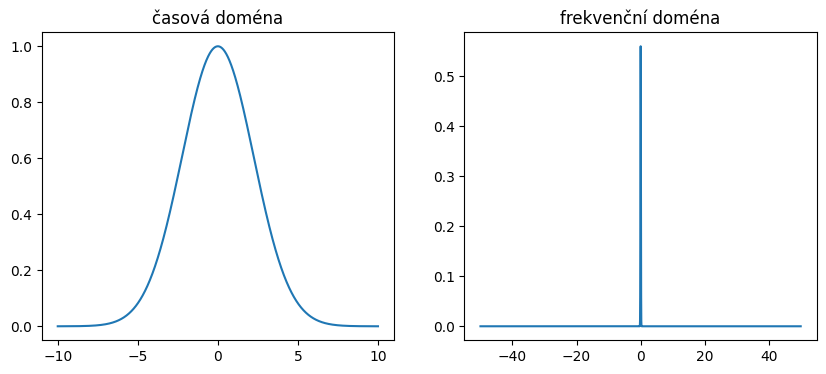

In [90]:
import numpy as np
import matplotlib.pyplot as plt
N = 2000
# neperiodický signál (pulz)
t = np.linspace(-10, 10, N)
alfa = 0.1                                  # čím užší signál v čase, tím širší ve frekvenci a naopak
f = np.exp(-alfa*t**2)                      # Gaussova funkce

# spojitá Fourierova transformace (numericky)
F1 = np.fft.fft(f)                          # spočítá DFT, výsledek je komplexní spektrum
F = np.fft.fftshift(F1)                     # přesune nulovou frekvenci doprostřed (jinak by byla na začátku pole)
F = np.abs(F / (N/2))                       # výpočet amplitudy

freq1 = np.fft.fftfreq(len(t), t[1]-t[0])   # vytvoří frekvenční osy (délka, krok)
freq = np.fft.fftshift(freq1)               # zarovná osu s posunutým spektrem

plt.figure(figsize=(10,4))
plt.subplot(1,2,1)
plt.plot(t, f)
plt.title("časová doména")
plt.subplot(1,2,2)
plt.plot(freq, F)
plt.title("frekvenční doména")
plt.show()


#### Gibbsův jev
- nespojitost → oscilace ve spektru

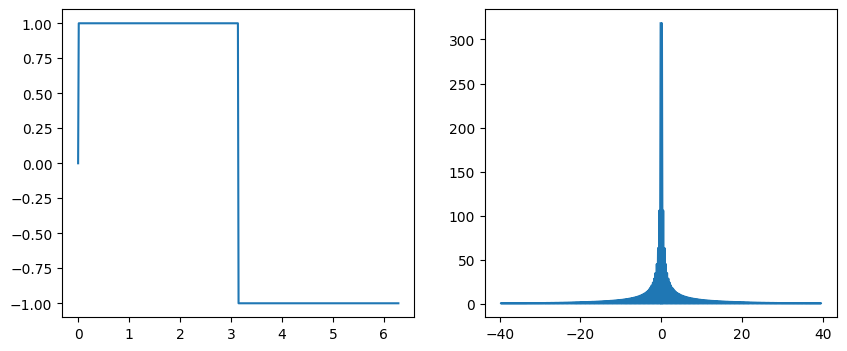

In [91]:
t = np.linspace(0,2*np.pi,500)
f = np.sign(np.sin(t))

F = np.fft.fft(f)
freq = np.fft.fftfreq(len(t), t[1]-t[0])

plt.figure(figsize=(10,4))

plt.subplot(1,2,1)
plt.plot(t,f)

plt.subplot(1,2,2)
plt.plot(freq, np.abs(F))

plt.show()

In [92]:
# funkce pro vizualizaci (amplituda, real, imag)
import matplotlib.pyplot as plt
def vizualizace(x, f, nazev, popisx):
    #frequencies = range(len(signal))
    # x je čas nebo frekvence
    #plt.figure(figsize=(8,4))

    # Vizualizace amplitud frekvencí
    amplitudes = abs(f)
    plt.plot(x, amplitudes, 'b')                   # amplituda
    plt.plot(x, f.real, 'm--')                      # real
    plt.plot(x, f.imag, 'c--')                      # imag
    plt.xlabel(popisx)
    plt.ylabel('Amplituda')
    plt.title(nazev)
    plt.legend(('amplitudes', 'real', 'imaginary'))

    plt.show()

In [93]:
from scipy.fft import fft
import numpy as np
N = 200
f = 15
t = np.linspace(0, 2*np.pi*f, N)    # signál musí být periodický v rámci FFT okna!
signal = np.sin(t)                  # všimněte si, jak se změní poměry pro funkci cos místo sin
transformed = fft(signal)
print(max(abs(transformed.real)))
print(max(abs(transformed.imag)))

23.06679926177454
96.08013366179287


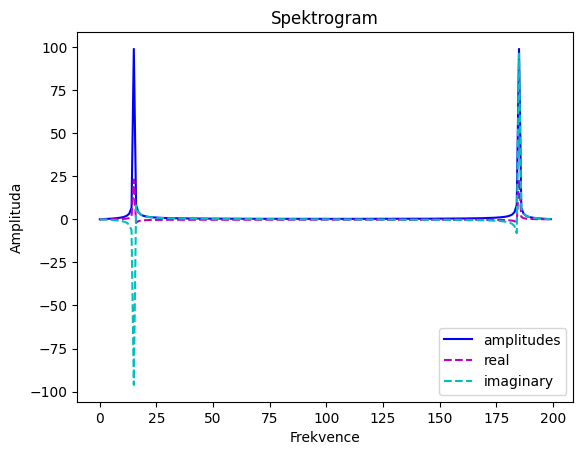

In [94]:
freq = range(len(signal))
vizualizace(freq, transformed, "Spektrogram", "Frekvence")

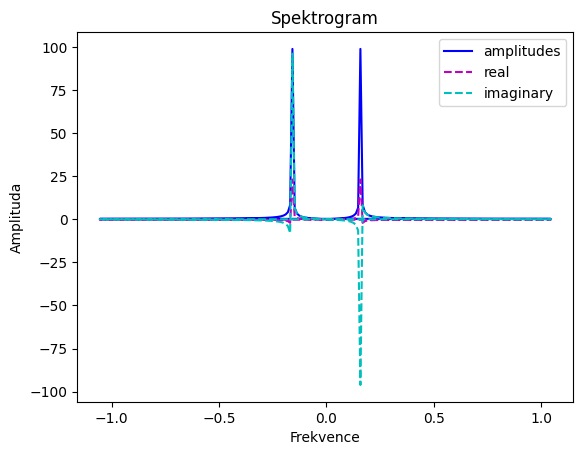

In [95]:
freq = np.fft.fftfreq(len(t), t[1]-t[0])
vizualizace(freq, transformed, "Spektrogram", "Frekvence")

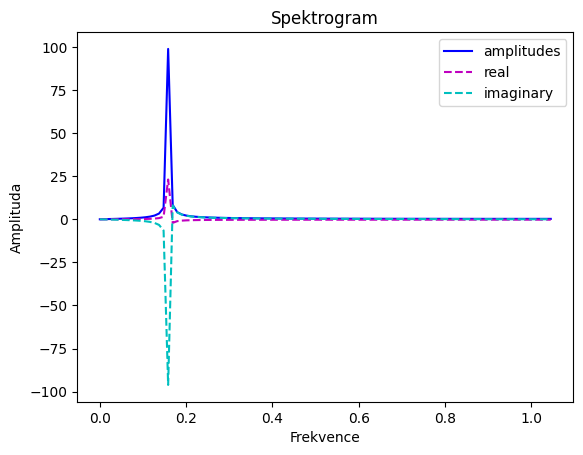

In [96]:
transformed = transformed[:N//2]    # vezme hodnoty signálu pro kladné frekvence
freq = freq[:N//2]                  # vezme kladné frekvence

vizualizace(freq, transformed, "Spektrogram", "Frekvence")

FFT jednoduchého signálu

In [97]:
from scipy.fft import fft
signal = [0, 1]
transformed = fft(signal)

print("signál:         ", signal)
print("po transformaci:", transformed)
print("amplituda:      ", np.abs(transformed))
print("úhel:           ", np.angle(transformed))

signál:          [0, 1]
po transformaci: [ 1.-0.j -1.-0.j]
amplituda:       [1. 1.]
úhel:            [-0.         -3.14159265]


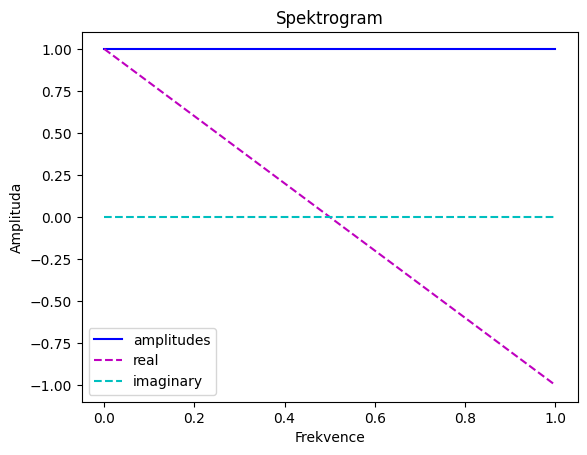

In [98]:
#plt.stem(range(len(signal)), abs(transformed), 'b-');                   # amplituda
vizualizace(range(len(signal)), transformed, "Spektrogram", "Frekvence")

FFT jednoduchého signálu
- FFT implicitně předpokládá periodicitu
- pokud zadám [1 2 3 4], FFT analyzuje [1 2 3 4 | 1 2 3 4 | 1 2 3 4 | ...]

In [99]:
from scipy.fft import fft
signal = [1, 2, 3, 4]
transformed = fft(signal)

print("signál:         ", signal)
print("po transformaci:", transformed)
print("amplituda:      ", np.abs(transformed))
print("úhel:           ", np.angle(transformed))

signál:          [1, 2, 3, 4]
po transformaci: [10.-0.j -2.+2.j -2.-0.j -2.-2.j]
amplituda:       [10.          2.82842712  2.          2.82842712]
úhel:            [-0.          2.35619449 -3.14159265 -2.35619449]


Vizualizace signálu ve frekvenční doméně

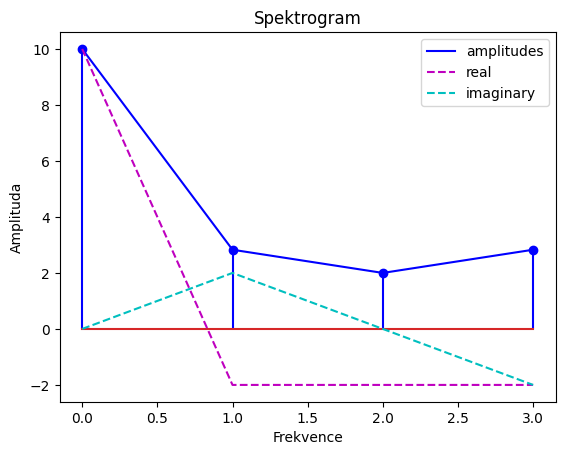

In [100]:
plt.stem(range(len(signal)), abs(transformed), 'b-');                   # ampituda
vizualizace(range(len(signal)), transformed, "Spektrogram", "Frekvence")


Inverzní FFT

In [101]:
from scipy.fft import ifft
s = ifft(transformed)         # scipy.fft.ifft


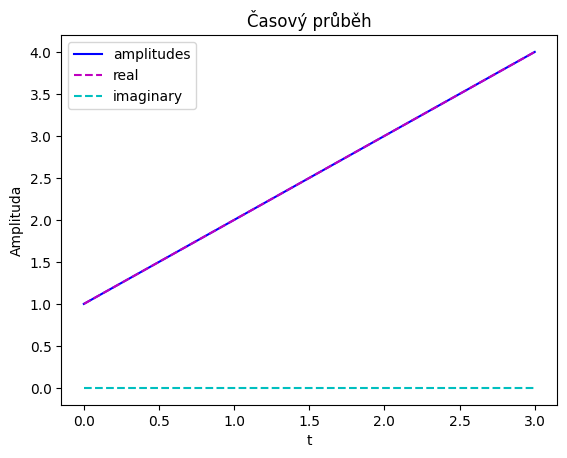

In [102]:
vizualizace(range(len(signal)), s, "Časový průběh", "t")

In [103]:
# sinusoida
import numpy as np
from scipy.fft import fft, ifft

t = np.linspace(0, 1, 1000)                     # Časový rozsah (rozlišení 1 ms)
omega = 2 * np.pi * 5                           # Frekvence v Hz (5 Hz)
signal = np.sin(omega * t)                      # Generování signálu

transformed_signal = fft(signal)                # Provedení FFT
restored_signal = ifft(transformed_signal).real # IFFT k obnovení původního signálu

Imaginární část =0

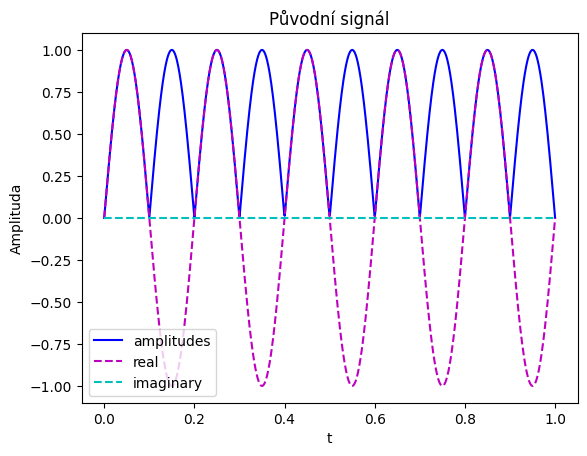

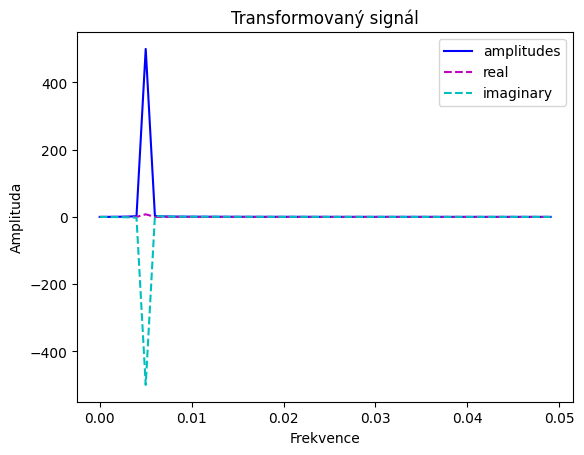

In [104]:
vizualizace(t, signal, "Původní signál", "t")
vizualizace(t[:50], transformed_signal[:50], "Transformovaný signál", "Frekvence")

np.fft.fftfreq(počet_vzorků, perioda_vzorkování)
- vrací pole frekvencí odpovídajících výstupu funkce fft()
- jaké frekvence jsou reprezentovány v transformovaném signálu

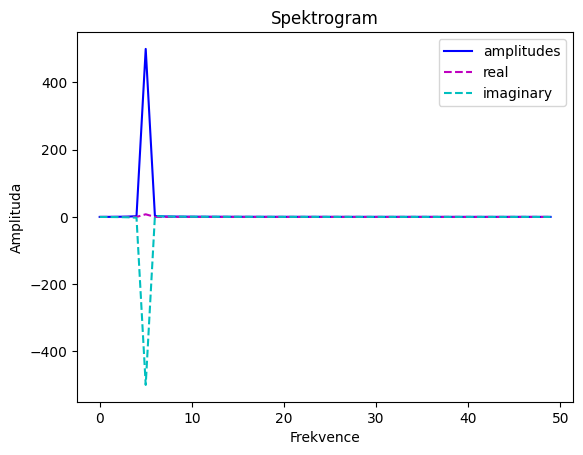

In [105]:
freqs = np.fft.fftfreq(len(t), d=t[1]-t[0])
#vizualizace(freqs, transformed_signal, "Spektrogram", "Frekvence")
amplitudes = transformed_signal                 # abs()
displ_freqs = freqs[:len(freqs)//2]
displ_ampls = amplitudes[:len(amplitudes)//2]
vizualizace(displ_freqs[:50], displ_ampls[:50], "Spektrogram", "Frekvence")

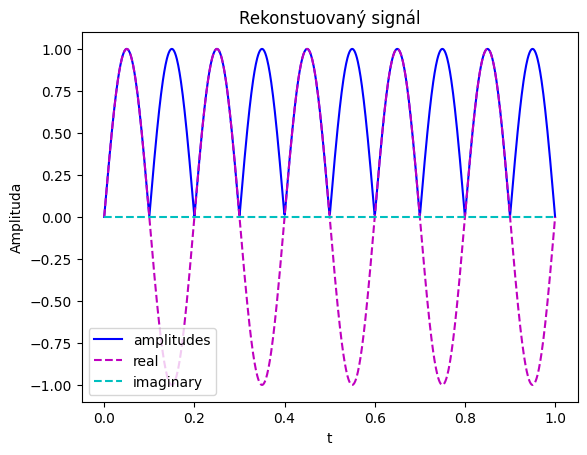

In [106]:
vizualizace(t, restored_signal, "Rekonstuovaný signál", "t")

In [107]:
import numpy as np
from scipy.fft import fft, ifft

Možno zadat jakýkoliv signál

In [108]:
# sinusoida
t = np.linspace(0, 1, 1000)                     # Časový rozsah (rozlišení 1 ms)
omega = 2 * np.pi * 5                           # Frekvence v Hz (5 Hz)
signal = np.sin(omega * t)                      # Generování signálu

In [109]:
# náhodný impulz
#t = np.arange(400)
count = len(t)
rng = np.random.default_rng()
signal = np.zeros((count,), dtype=complex)
od = int(0.1*count)
do = int(0.15*count)
signal[od:do] = np.exp(1j*rng.uniform(0, 2*np.pi, (do-od,)))

In [110]:
# sinusoida
signal = np.sin(50.0 * 2.0*np.pi*t) + 0.5*np.sin(80.0 * 2.0*np.pi*t)

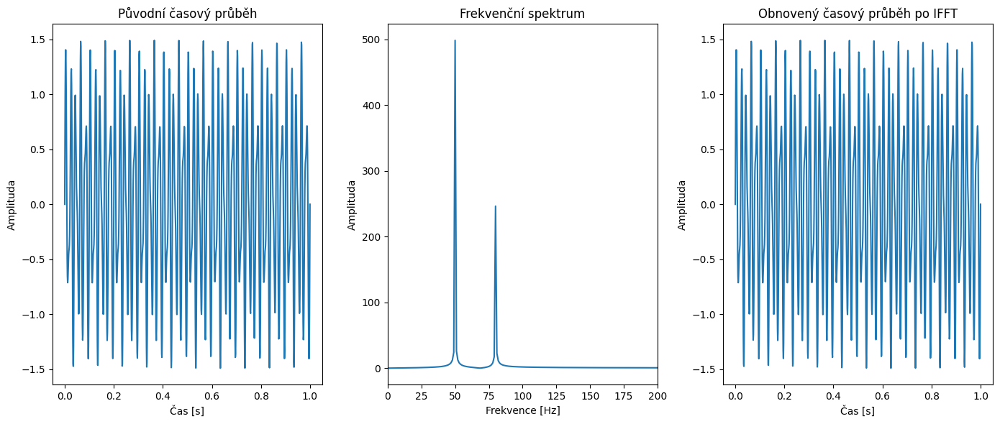

In [111]:
transformed_signal = fft(signal)                # Provedení FFT
restored_signal = ifft(transformed_signal).real # IFFT k obnovení původního signálu
freqs = np.fft.fftfreq(len(t), d=t[1]-t[0])
amplitudes = abs(transformed_signal)            # abs()

# Vizualizace výsledků přehledně
plt.figure(figsize=(14,6))

plt.subplot(131)
plt.plot(t, signal)
plt.title('Původní časový průběh')
plt.xlabel('Čas [s]')
plt.ylabel('Amplituda')

plt.subplot(132)
#plt.stem(freqs[:len(freqs)//2], amplitudes[:len(amplitudes)//2])
plt.plot(freqs[:len(freqs)//2], amplitudes[:len(amplitudes)//2])
plt.title('Frekvenční spektrum')
plt.xlabel('Frekvence [Hz]')
plt.ylabel('Amplituda')
plt.xlim(0, 200)


plt.subplot(133)
plt.plot(t, restored_signal)
plt.title('Obnovený časový průběh po IFFT')
plt.xlabel('Čas [s]')
plt.ylabel('Amplituda')

plt.tight_layout()
plt.show()

Jak vypadají jednotlivá pole?

In [112]:
import numpy as np
from scipy.fft import fft, fftfreq

N = 60           # Počet vzorků
Ts = 1.0 / 500.0  # Perioda vzorkování (odpovídá vzorkovací frekvenci 500 Hz)
x = np.linspace(0.0, N*Ts, N, endpoint=False)  # Časová osa
y = np.sin(50.0 * 2.0 * np.pi * x)         # Signál s frekvencí 50 Hz

# Výpočet FFT a frekvencí
yf = fft(y)                              # FFT signálu
# komplexní pole, které reprezentuje amplitudu a fázi různých frekvenčních složek
xf = fftfreq(N, Ts)                       # Frekvenční osa (celkem vzorlů, krok)

# výpis
np.set_printoptions(precision=2)
print("Frekvence, v rozmezí od 0 do fs/2 (kladné frekvence) a od -fs/2 zpět do 0 (záporné frekvence)")
print(xf)
print("Komplexní pole amplitud (prvních 6 hodnot)")
print(yf[:6])

# Omezení na kladné frekvence - obě pole vezmeme od 0 do n/2
xf = xf[:N//2]                          # Kladné frekvence
yf = 2.0 / N * np.abs(yf[:N//2])        # Normalizace amplitudy
# abs. hodnota reprezentuje amplitudy jednotlivých frekvencí

# výpis
print("\nNezáporné frekvence")
print(xf)
print("Pole amplitud")
print(yf)
np.set_printoptions(precision=10)


Frekvence, v rozmezí od 0 do fs/2 (kladné frekvence) a od -fs/2 zpět do 0 (záporné frekvence)
[   0.      8.33   16.67   25.     33.33   41.67   50.     58.33   66.67
   75.     83.33   91.67  100.    108.33  116.67  125.    133.33  141.67
  150.    158.33  166.67  175.    183.33  191.67  200.    208.33  216.67
  225.    233.33  241.67 -250.   -241.67 -233.33 -225.   -216.67 -208.33
 -200.   -191.67 -183.33 -175.   -166.67 -158.33 -150.   -141.67 -133.33
 -125.   -116.67 -108.33 -100.    -91.67  -83.33  -75.    -66.67  -58.33
  -50.    -41.67  -33.33  -25.    -16.67   -8.33]
Komplexní pole amplitud (prvních 6 hodnot)
[-1.68e-15-0.00e+00j  1.68e-14+7.50e-15j -1.58e-14+1.03e-14j
 -3.42e-15-7.73e-15j  3.91e-15-4.05e-15j -2.66e-15-4.55e-15j]

Nezáporné frekvence
[  0.     8.33  16.67  25.    33.33  41.67  50.    58.33  66.67  75.
  83.33  91.67 100.   108.33 116.67 125.   133.33 141.67 150.   158.33
 166.67 175.   183.33 191.67 200.   208.33 216.67 225.   233.33 241.67]
Pole amplitud
[5.59

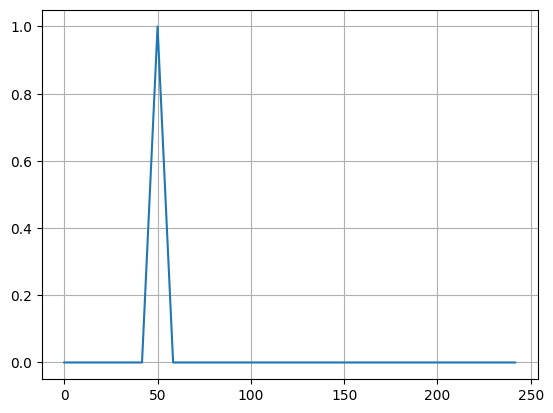

In [113]:
import matplotlib.pyplot as plt
plt.plot(xf, yf)                         # Graf amplitudového spektra
plt.grid()
plt.show()


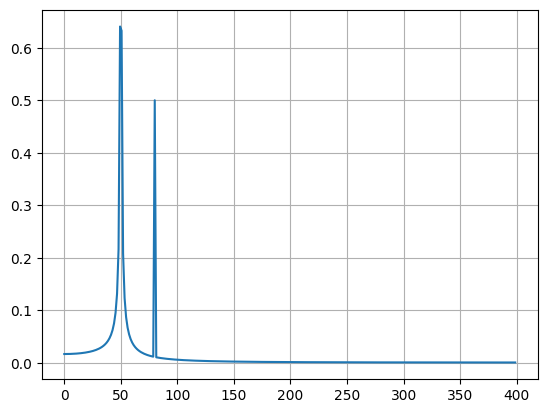

In [114]:
import numpy as np
from scipy.fft import fft, fftfreq
N = 600                         # počet vzorků
Ts = 1.0 / 800.0                # perioda vzorkování
x = np.linspace(0.0, N*Ts, N, endpoint=False)
y = np.sin(50.0 * 2.0*np.pi*x) + 0.5*np.sin(80.0 * 2.0*np.pi*x)
yf = fft(y)                     # 1D diskrétní FFT
xf = fftfreq(N, Ts)[:N//2]      # frekvence FFT

import matplotlib.pyplot as plt
plt.plot(xf, 2.0/N * np.abs(yf[0:N//2]))
plt.grid()
plt.show()

### Fourierova transformace - příklad

Možno řešit pomocí knihovny NumPy nebo SciPy

In [115]:
import numpy as np
from numpy.fft import fft, ifft         # pomalejší

In [116]:
import numpy as np
from scipy.fftpack import fft, ifft     # rychlejší

Příprava signálu (v poli x)

In [117]:
Tc = 1                          # celkový čas [s]
fs = 2000                       # vzorkovací frekvence (sampling rate, Hz) - pozor na aliasing 
Ts = 1/fs                       # perioda vzorkování (sampling interval, s)
N = Tc*fs                       # celkový počet vzorků
print(N)

t = np.arange(0, Tc, Ts)        # časová osa od 0 do t_span [0.0 až 0.995 s]
print(len(t), t[-1])
#t = np.linspace(0, Tc, N)      # časová osa od 0 do t_span [0.0 až 1.0 s]
#print(len(t), t[-1])

2000
2000 0.9995


Signál 1

In [118]:
u1 = 3 * np.sin(2*np.pi*1*t)                    # frekvence 1
u2 = 0
u3 = np.sin(2*np.pi*4*t)                        # frekvence 4
u4 = 0
u5 = 0
u6 = 0
u7 = 0.5 * np.sin(2*np.pi*7*t)                  # frekvence 7

x = u1 + u2 + u3 + u4 + u5 + u6 + u7

Signál 2 (trojúhelník)

In [119]:
pi2 = np.pi/2
u1 = 0.81   * np.cos(2*np.pi*1*t - pi2)        # frekvence 1    8./pi/pi
u2 = 0
u3 = 0.09   * np.cos(2*np.pi*3*t + pi2)        # frekvence 3    8./3/3/pi/pi
u4 = 0
u5 = 0.0324 * np.cos(2*np.pi*5*t - pi2)        # frekvence 5    8./5/5/pi/pi
u6 = 0
u7 = 0.0165 * np.cos(2*np.pi*7*t + pi2)        # frekvence 7    8./7/7/pi/pi

x = u1 + u2 + u3 + u4 + u5 + u6 + u7

Signál 3 (delta funkce)

In [120]:
u1 = u2 = u3 = u4 = u5 = u6 = u7 = 0
x = np.zeros(N, dtype=np.ndarray)
x[100] = 10

Vykreslení zvoleného signálu

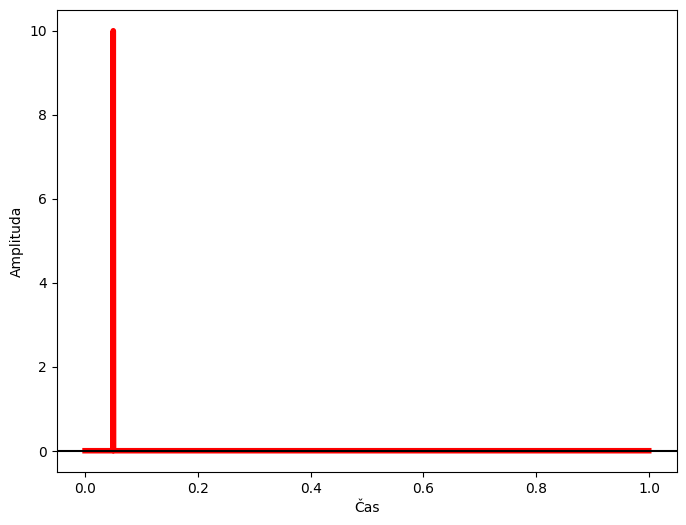

In [121]:
import matplotlib.pyplot as plt

plt.figure(figsize = (8, 6))
if type(u1) == np.ndarray: plt.plot(t, u1, color = 'lightgreen')
if type(u2) == np.ndarray: plt.plot(t, u2, 'b')
if type(u3) == np.ndarray: plt.plot(t, u3, color = 'lightgray')
if type(u4) == np.ndarray: plt.plot(t, u4, 'm')
if type(u5) == np.ndarray: plt.plot(t, u5, 'y')
if type(u6) == np.ndarray: plt.plot(t, u6, 'p')
if type(u7) == np.ndarray: plt.plot(t, u7, 'c')
plt.plot(t, x, 'r', linewidth = 4)

plt.axhline(y = 0, color='k')               # vykreslení osy x (osa y axvline)
plt.xlabel('Čas')
plt.ylabel('Amplituda')

plt.show()

FFT a inverzní FFT

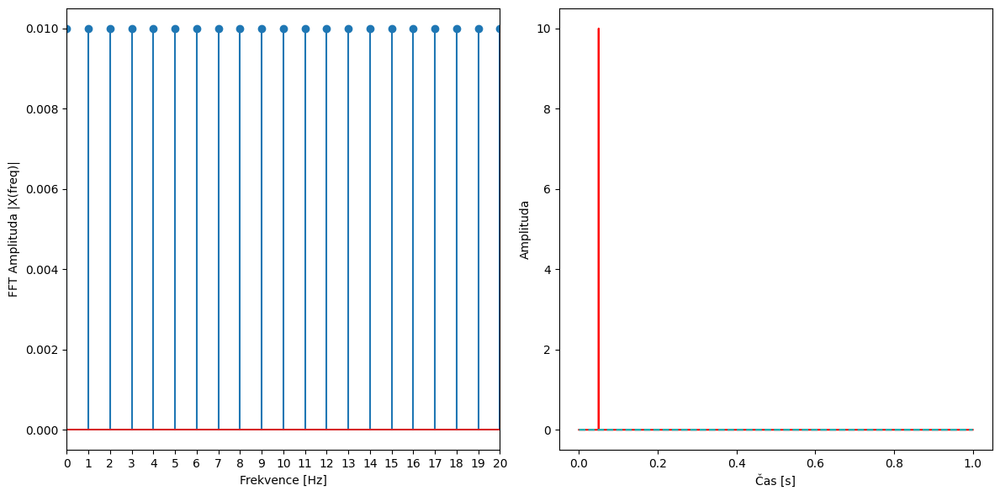

In [122]:
def frekvence1():
    global freq, Xc
    ts = np.arange(N)                   # jednotlivé časy [0 až 1999]
    #Tc = N/fs                          # celkový čas [1.0]   (fs vzorkovací frekvence)
    freq = ts/Tc 
    Xc = 2.0 / N * np.abs(X)            # normované amplitudy

def frekvence2():
    global freq, Xc
    freq = fftfreq(N, Ts)               # Frekvenční osa (celkem vzorků, perioda vzorkování)

    # Omezení na kladné frekvence - obě pole vezmeme od 0 do n/2
    freq = freq[:N//2]                  # Kladné frekvence
    Xc = 2.0 / N * np.abs(X[:N//2])     # Normalizace amplitudy

X = fft(x)                              # FFT, x z předch. příkladu
#N = len(X)  # příp. N = fs*Tc         # Počet vzorků (2000)

frekvence2()

# Vizualizace
plt.figure(figsize = (12, 6))

plt.subplot(121)
plt.stem(freq, np.abs(Xc))              # stem
plt.xlabel('Frekvence [Hz]')
plt.ylabel('FFT Amplituda |X(freq)|')

# Nastavení osy x na přirozená čísla
plt.xticks(range(21))  # Explicitně nastavíme značky na ose x
plt.xlim(0, 20)                         # nastaví meze osy x

plt.subplot(122)
plt.plot(t, ifft(X).real, 'r')          # inverzní FFT (real jen kvůli zaokrouhlovacím chybám)
plt.plot(t, ifft(X).imag, 'c--')        # jen pro kontrolu
plt.xlabel('Čas [s]')
plt.ylabel('Amplituda')
plt.tight_layout()                      # jen kvůli rozložení grafů do obrázku
plt.show()

## Zpracování 2D signálu

In [ ]:
# balíček ke stahování a správě datasetů SciPy; nutno restartovat python
%pip install pooch

## Uložení a načtení pole a obrázku 

Pillow (PIL Fork)
- základní úpravy obrázků
- jednoduché, standard

imageio 
- široká podpora formátů, méně funkcí
- spolehlivě načte i obrázky přes HTTP

OpenCV (cv2, Computer Vision)
- nejrychlejší (C++) a nejvýkonnější pro zpracování obrazu a počítačové vidění

scikit-image (skimage)
- vědecká a výuková práce s obrazy, zpracování signálů 2D
- méně efektivní než OpenCV

In [ ]:
%pip install pillow
%pip install imageio
%pip install opencv-python
%pip install scikit-image

Typ:   <class 'numpy.ndarray'>
Length 512
Shape: (512, 512, 3)
dtype: uint8
Max:   255


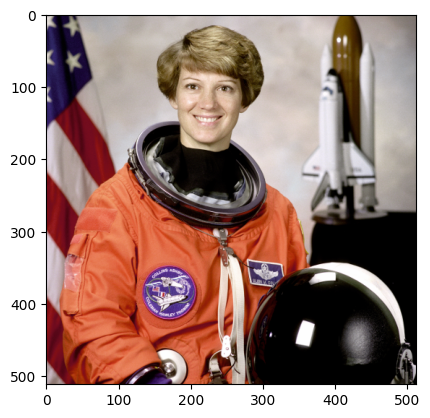

In [24]:
# Načtení z datasetu
from skimage import data
import matplotlib.pyplot as plt
import numpy as np
img_array1 = data.astronaut()             # obrázek astronautky Eileen Collins 512 x 512
print("Typ:  ", type(img_array1))
print("Length", len(img_array1))
print("Shape:", img_array1.shape)
print("dtype:", img_array1.dtype)
print("Max:  ", img_array1.max())

#plt.figure()
plt.imshow(img_array1)                    # vykreslení pole image
plt.show()


Binární data		 typ: <class 'bytes'>	 (délka 135903)
File‑like objekt	 typ: <class '_io.BytesIO'>
Obrázek PIL		 typ: <class 'PIL.JpegImagePlugin.JpegImageFile'>


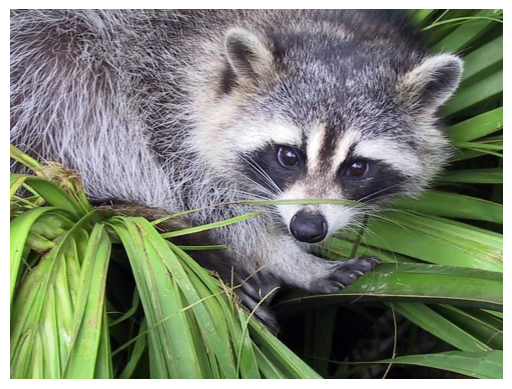

In [22]:
# Načtení obrázku z webu
import requests
import io
from PIL import Image
import matplotlib.pyplot as plt

url = "https://pixnio.com/free-images/fauna-animals/raccoons/raccoon-procyon-lotor-960x720.jpg"

response = requests.get(url, headers={"User-Agent": "Mozilla/5.0"}, verify=True)    # stažení obrázku s ověřením certifikátu

image_data = response.content                                                       # čistá binární data
print(f"Binární data\t\t typ: {type(image_data)}\t (délka {len(image_data)})")

image_file_like = io.BytesIO(image_data)                                            # file‑like objekt (z binárních dat)
print(f"File‑like objekt\t typ: {type(image_file_like)}")

img2 = Image.open(image_file_like)                                                  # PIL očekává soubor nebo file‑like objekt
print(f"Obrázek PIL\t\t typ:", type(img2))

# Zobrazení
plt.imshow(img2)
plt.axis("off")
plt.show()

In [ ]:
img2.show()                                 # zobrazení v externím prohlížeči

Typ:   <class 'numpy.ndarray'>
Shape: (720, 960, 3)
dtype: uint8
Max:   255


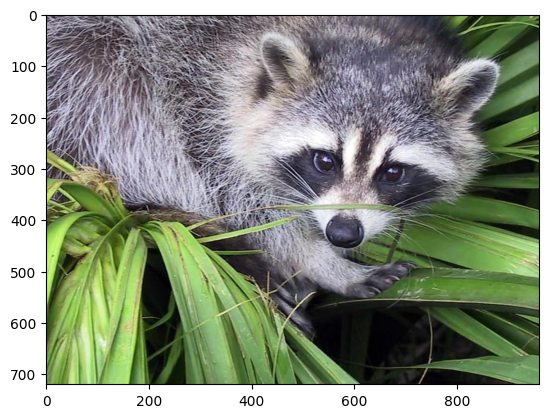

In [26]:
# Převod obrázku na np.array
img_array2 = np.array(img2)
print("Typ:  ", type(img_array2))
#print("Délka:", len(img_array2))
print("Shape:", img_array2.shape)
print("dtype:", img_array2.dtype)
print("Max:  ", img_array2.max())
plt.imshow(img_array2)                    # vykreslení pole image
plt.show()


In [ ]:
# Převod np.array na obrázek
from PIL import Image
print("Předdefinované pole:\t", type(img_array2))
im = Image.fromarray(img_array2)                       # převod pole na obrázek PIL
print("Obrázek z pole:\t\t", type(im))

Předdefinované pole:	 <class 'numpy.ndarray'>
Obrázek z pole:		 <class 'PIL.Image.Image'>


Uložení do souboru

In [ ]:
im.save("tmp/myval.jpg")                               # uložení obrázku PIL

import matplotlib.image
matplotlib.image.imsave('tmp/myval2.jpg', img_array2)  # uložení pole jako obr.

Načtení ze souboru

Typ (PIL): <class 'PIL.JpegImagePlugin.JpegImageFile'>
Typ (IIO): <class 'numpy.ndarray'>
Typ (CV2): <class 'numpy.ndarray'>
Typ (ski): <class 'numpy.ndarray'>
Formát (PIL):  JPEG RGB
Shape  (IIO):  (720, 960, 3)
Shape  (CV2):  (720, 960, 3)
Shape  (ski):  (720, 960, 3)
True


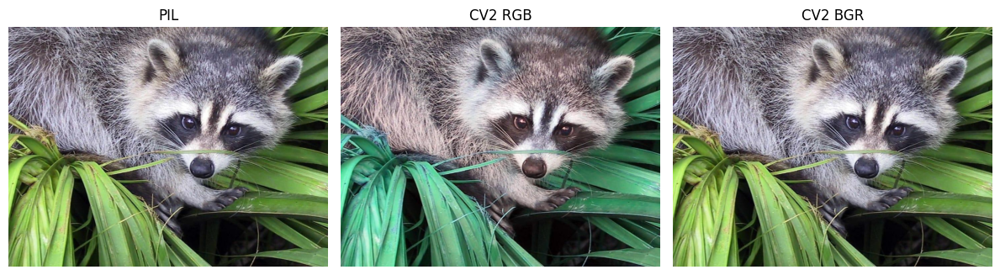

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image
import imageio.v3 as iio
import cv2
import skimage

# Načtení obrázku
im2 = Image.open('tmp/myval.jpg')               # pomocí PIL
im3 = iio.imread('tmp/myval.jpg')               # jako pole pomocí imageio
im4 = cv2.imread("tmp/myval.jpg")               # jako pole pomocí cv2
im5 = skimage.io.imread("tmp/myval.jpg")

print("Typ (PIL):", type(im2))
print("Typ (IIO):", type(im3))
print("Typ (CV2):", type(im4))
print("Typ (ski):", type(im5))
print("Formát (PIL): ", im2.format, im2.mode)
print("Shape  (IIO): ", im3.shape)
print("Shape  (CV2): ", im4.shape)
print("Shape  (ski): ", im5.shape)
print((im3==im5).all())                             # jsou totožné

plt.figure(figsize = (12, 6))
plt.subplot(131)
plt.imshow(im2)
#plt.imshow(im3)                                    # funguje stejně
plt.axis('off')
plt.title("PIL")

plt.subplot(132)
plt.imshow(im4)                                     # imshow zobrazuje RGB
plt.axis('off')
plt.title("CV2 RGB")

plt.subplot(133)
img_cv_rgb = cv2.cvtColor(im4, cv2.COLOR_BGR2RGB)   # přehodí pořadí
plt.imshow(img_cv_rgb)
plt.axis('off')
plt.title("CV2 BGR")

plt.tight_layout()
plt.show()

#im2.show()                                         # otevření v přidružené aplikaci

Přístup k barevným kanálům (poslední index matice)

(720, 960)


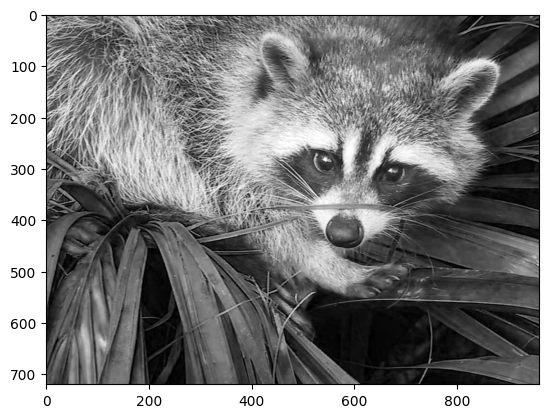

In [42]:
img = im3                       # ve formě pole
R = img[:, :, 0]
G = img[..., 1]                 # jiný zápis přes tři tečky
B = img[..., 2]                 # nebo -1
print(R.shape)
plt.imshow(B, cmap='gray');     # modrý kanál čb. (výchozí se nehodí)

Změny barevných charakteristik

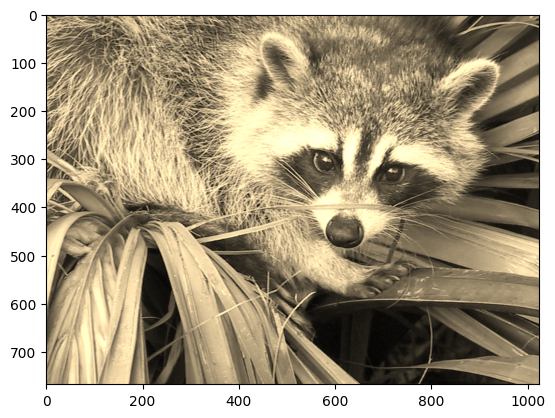

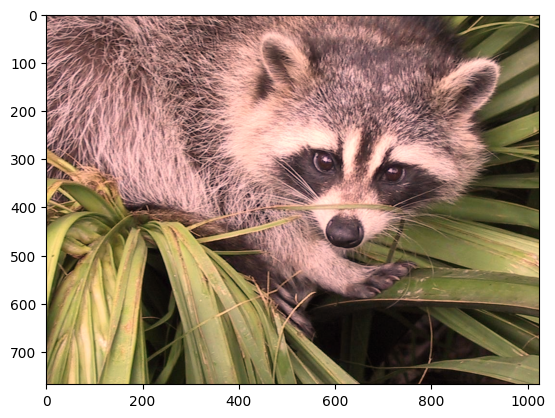

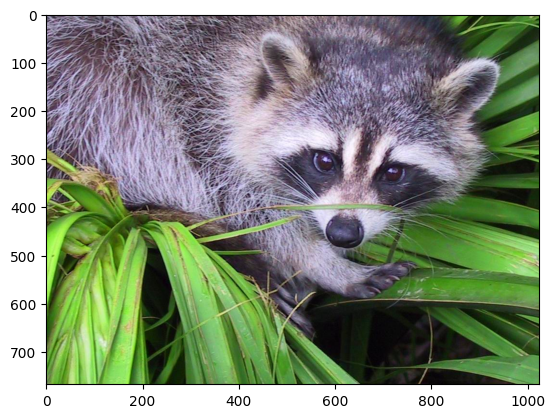

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image

image = Image.open('tmp/myval.jpg')              # načtení obrázku pomocí PIL
# Convert to numpy array for faster processing
img_array = np.array(image)

# [R']   [a, b, c]   [R]
# [G'] = [d, e, f] . [G]
# [B']   [g, h, i]   [B]

# např. pro sepia:
# R' = 0.393 R + 0.769 G + 0.189 B
# G' = 0.349 R + 0.686 G + 0.168 B
# B' = 0.272 R + 0.534 G + 0.131 B

# Apply sepia transformation using matrix operations
sepia_matrix = np.array([
    [0.393, 0.769, 0.189],
    [0.349, 0.686, 0.168],
    [0.272, 0.534, 0.131]
])
grayscale_matrix = np.array([
    [0.299, 0.587, 0.114],
    [0.299, 0.587, 0.114],
    [0.299, 0.587, 0.114]
])
invert_matrix = np.array([
    [-1, 0, 0],
    [0, -1, 0],
    [0, 0, -1]
]) # Poté se musí přičíst 1 k výsledným hodnotám
saturate_matrix = np.array([
    [1.3, -0.3, 0],
    [-0.2, 1.3, -0.1],
    [0, -0.2, 1.2]
])
desaturate_matrix = np.array([
    [0.6, 0.3, 0.1],
    [0.3, 0.6, 0.1],
    [0.1, 0.3, 0.6]
])
warm_matrix = np.array([
    [1.2, 0, 0],
    [0, 1.0, 0],
    [0, 0, 0.8]
])
cold_matrix = np.array([
    [0.8, 0, 0],
    [0, 1.0, 0],
    [0, 0, 1.2]
])
green_tint_matrix = np.array([
    [0.8, 0.2, 0],
    [0.1, 1.1, 0],
    [0.1, 0.2, 0.8]
])
cross_process_matrix = np.array([
    [1.0, 0.2, 0.1],
    [0, 0.9, 0.1],
    [0, 0.2, 0.7]
])

def nasobMatici(img_array, matice):
    flat1 = img_array.reshape(-1, 3)                    # Reshape na jednotlivé pixely R,G,B, aby se transformace aplikovala na všechny pixely najednou
    flat2 = flat1 @ matice.T
    #print(flat1.shape, flat2.shape)                     # (786432, 3), (786432, 3)

    flat2 = flat2.reshape(img_array.shape)              # Reshape zpátky do původního rozměru 
    img_array = np.clip(flat2, 0, 255).astype(np.uint8) # Omezit hodnoty na 0-255
    plt.imshow(Image.fromarray(img_array))
    plt.show()

nasobMatici(img_array, sepia_matrix)
nasobMatici(img_array, cross_process_matrix)
nasobMatici(img_array, saturate_matrix)

Načtení a převod na stupně šedé

(720, 960, 3) (720, 960)


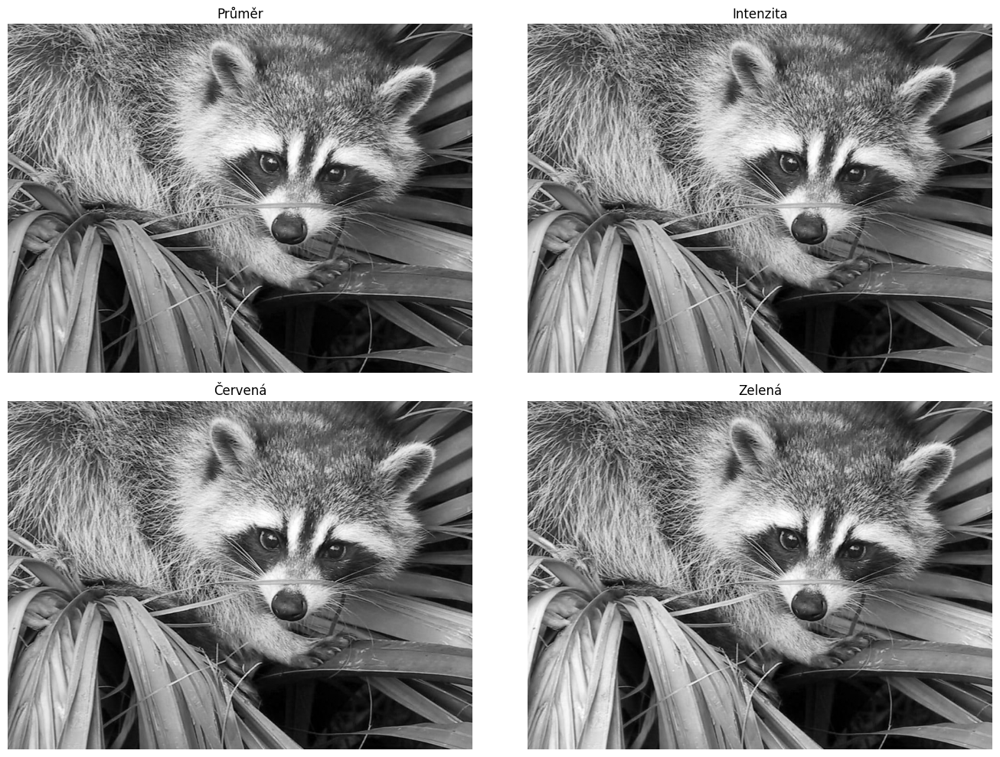

In [ ]:
# imageio
import imageio.v3 as iio
import numpy as np
# Načtení obrázku do pole
img = iio.imread("tmp/myval.jpg")

# Pokud obrázek není ve stupních šedi, převedeme ho
if len(img.shape) == 3:
    imgbw = np.mean(img, axis=2)    # průměrujeme přes RGB kanály (!)
print(img.shape, imgbw.shape)

plt.figure(figsize = (14, 10))

plt.subplot(221)
plt.axis('off')
plt.title("Průměr")
plt.imshow(imgbw, "gray")

# Správný postup
imgbw1 = np.dot(img[..., :3], [0.299, 0.587, 0.114]).astype(np.uint8)
plt.subplot(222)
plt.axis('off')
plt.title("Intenzita")
plt.imshow(imgbw1, "gray")

# Jeden z barevných kanálů
imch = img[..., 0].astype(np.float32)
plt.subplot(223)
plt.axis('off')
plt.title("Červená")
plt.imshow(imgbw1, "gray")

# Jeden z barevných kanálů
imch = img[..., 1].astype(np.float32)
plt.subplot(224)
plt.axis('off')
plt.title("Zelená")
plt.imshow(imch, "gray")
plt.tight_layout();

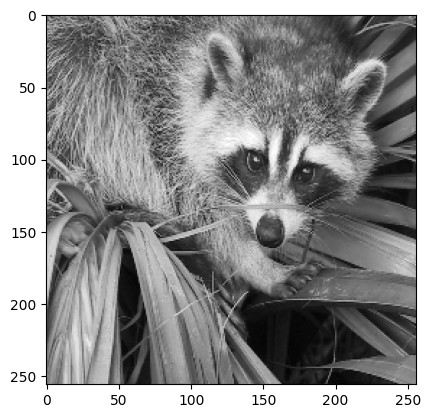

In [ ]:
# cv2
import cv2  # OpenCV pro načítání obrázku
# Načtení obrázku a konverze do odstínů šedi
imgbw2 = cv2.imread("tmp/myval.jpg", cv2.IMREAD_GRAYSCALE)      # načte obrázek
imgbw2 = cv2.resize(imgbw2, (256, 256))                         # přizpůsobí velikost
plt.imshow(imgbw2, cmap="gray")
plt.show()

### Vyhlazení obrazu

2D filtr odpovídající 3. řádu kubického spline
- B-spline v ose x
- B-spline v ose y
$$
B_3(x) = \frac{1}{6}\left(|x-2|^3 - 4|x-1|^3 + 6|x|^3 - 4|x+1|^3 + |x+2|^3\right)
$$
$$
B_3​(x,y)=B_3​(x)⋅B_3​(y)
$$
Původní obraz a vyhlazený

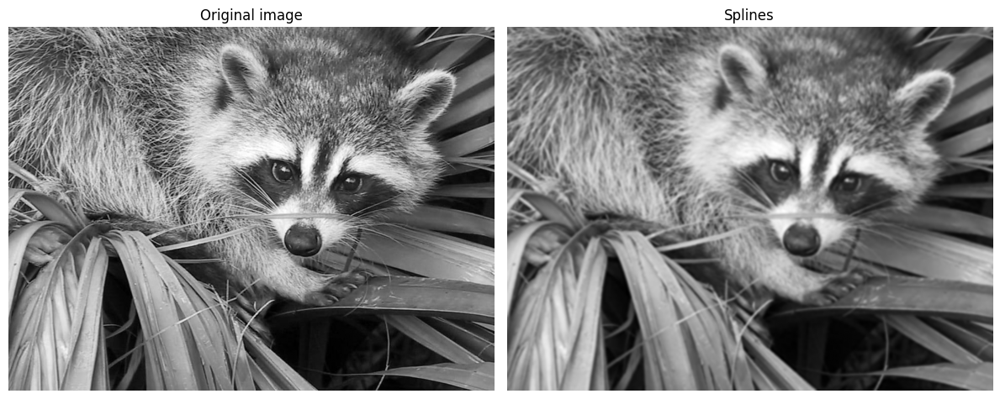

In [92]:
from scipy import signal, datasets
import matplotlib.pyplot as plt
import numpy as np
import imageio.v3 as iio
import cv2

# Načtení origiálu a převod do stupňů šedi
imgbw2 = cv2.imread("tmp/myval.jpg", cv2.IMREAD_GRAYSCALE)     # načte obrázek ve stupních šedi
image = imgbw2

# Vyhladíme signál
ck = signal.cspline2d(image, 8.0)                       # 2D kubický spline (hladkost interpolace 8.0)
#ck = image

# Vizualizace
plt.figure(figsize=(12,6))                  # nový obrázek
plt.gray()                                  # šedá (nastavení colormap)
plt.subplot(121)
plt.title('Original image')                 # nadpis
plt.axis('off')
plt.imshow(image)                           # vykreslení pole image

plt.subplot(122)
plt.title('Splines')                        # nadpis
plt.axis('off')
plt.imshow(ck)
plt.tight_layout()
plt.show()



In [34]:
def stretch(a):
    return (a - a.min()) / (a.max() - a.min())

def percentiles(a):
    p1, p99 = np.percentile(a, (2, 98))            # zůstává (1, 99)
    return np.clip((a - p1) / (p99 - p1), 0, 1)

def histEqualize(a):
    from skimage import exposure
    return exposure.equalize_hist(a)

def CLAHE(a):           # Adaptive histogram equalization 
    from skimage import exposure
    a_norm = (a - a.min()) / (a.max() - a.min())
    return exposure.equalize_adapthist(a_norm, clip_limit=0.03)

## Konvoluce
separabilní konvoluce 2D signálu s 2D jádrem
- často prováděno odděleně podle jednotlivých dimenzí
    - jádro se rozloží na dvě separabilní jádra (jedno pro každou dimenzi) 
    - provede se konvoluce s těmito jádry postupně podél každé dimenze
- snížení výpočetní náročnosti 

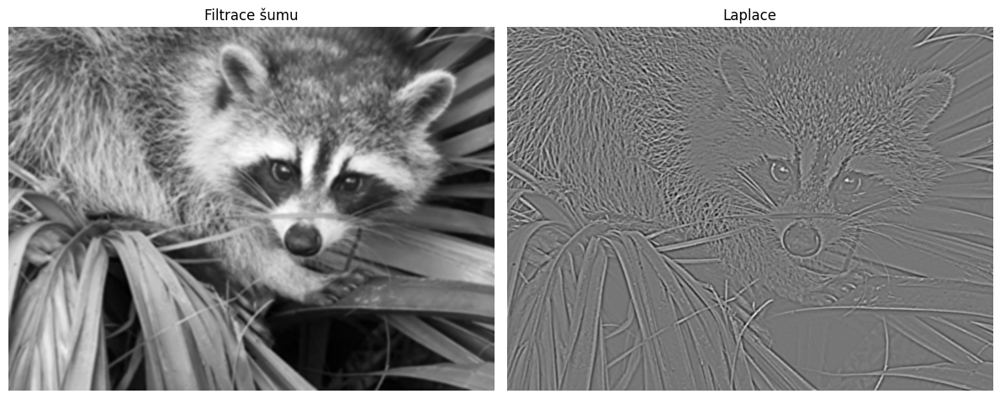

In [93]:
jadro1 = np.array([[0,1,0],                     # jádro konvoluce
                   [1,2,1], 
                   [0,1,0]], 
                   dtype=np.float32)

# Laplaceova konvoluce 
laplacian = np.array([[0,1,0],                  # jádro konvoluce
                      [1,-4,1], 
                      [0,1,0]], 
                      dtype=np.float32)
# Laplaceova konvoluce 
laplacian2 = np.array([[0,-1,0],                  # jádro konvoluce
                      [-1,4,-1], 
                      [0,-1,0]], 
                      dtype=np.float32)

#ck = image
vysl1 = signal.convolve2d(ck, jadro1, mode='same', boundary='symm')     # obraz, jádro, stejná velikost, symetrické okrajové podmínky
laplace = signal.convolve2d(ck, laplacian2, mode='same', boundary='symm')  # obraz, jádro, stejná velikost, symetrické okrajové podmínky

# Vizualizace
plt.figure(figsize=(12,6))                      # nový obrázek
plt.gray()                                      # šedá (nastavení colormap)
plt.subplot(121)
plt.title('Filtrace šumu')                      # nadpis
plt.axis('off')
plt.imshow(vysl1)                               # vykreslení pole image

plt.subplot(122)
plt.title('Laplace')                            # nadpis
plt.axis('off')
plt.imshow(laplace)
#plt.imshow(percentiles(laplace))

plt.tight_layout()
plt.show()
#print (np.linalg.norm(deriv - deriv2))

Hranové filtry

FIR (Finite Impulse Response) filtr
- provádí 2D separabilní filtraci obrazu
- místo 2D konvoluce použijeme dvě 1D konvoluce – nejdřív po řádcích, pak po sloupcích
- sníží výpočetní náročnost konvoluce z O(m × n × k × l) na O(m × n × (k + l))

[ 1. -2.  1.]


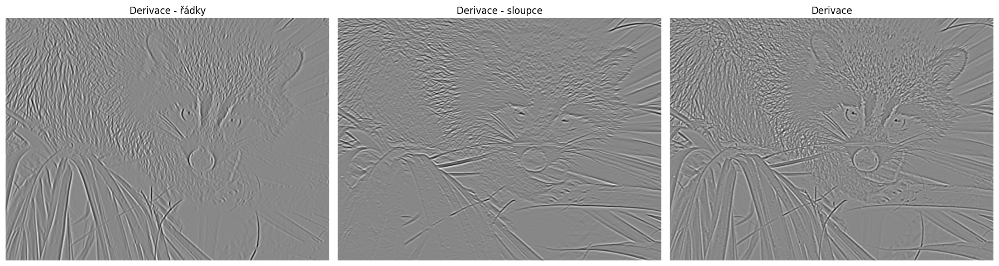

In [94]:
filtr = np.array([1.0, -2, 1.0], dtype=np.float32)  # derivační filtr (2. derivace)
print(filtr)
sH = signal.sepfir2d(ck, filtr, [1])            # aplikuje derivační filtr na řádky (x-směr)
sV = signal.sepfir2d(ck, [1], filtr)            # aplikuje derivační filtr na sloupce (y-směr)
sHV = sH + sV                                   # konvoluce (2D FIR)

# Vizualizace
plt.figure(figsize=(18,6))                      # nový obrázek
plt.gray()                                      # šedá (nastavení colormap)
plt.subplot(131)
plt.title('Derivace - řádky')                   # nadpis
plt.axis('off')
plt.imshow(sH)                                  # vykreslení pole image

plt.subplot(132)
plt.title('Derivace - sloupce')                 # nadpis
plt.axis('off')
plt.imshow(sV)

plt.subplot(133)
plt.title('Derivace')                           # nadpis
plt.axis('off')
plt.imshow(sHV)
plt.tight_layout()
plt.show()


Porovnání s laplaciánem

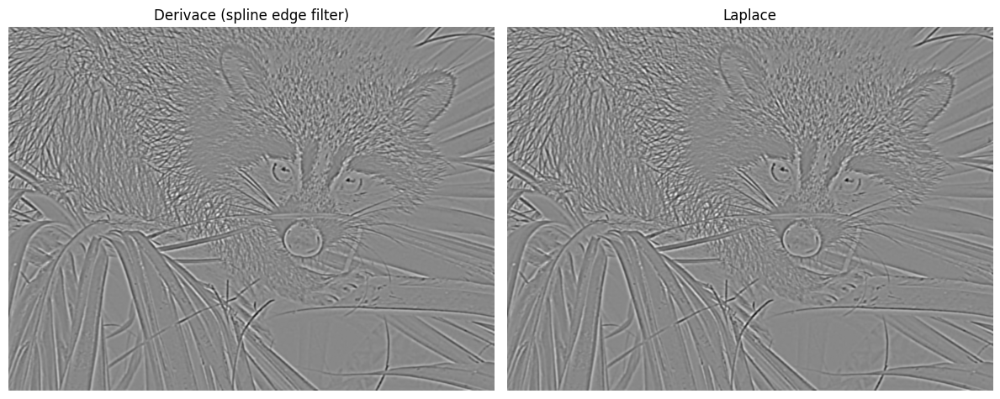

np.float64(7.105427357601002e-14)

In [ ]:
# Vizualizace
plt.figure(figsize=(12,6))                      # nový obrázek
plt.gray()                                      # šedá (nastavení colormap)
plt.subplot(121)
plt.title('Derivace (spline edge filter)')      # nadpis
plt.axis('off')
plt.imshow(sHV)                               # vykreslení pole image

plt.subplot(122)
plt.title('Laplace')                            # nadpis
plt.axis('off')
plt.imshow(-laplace)
plt.tight_layout()
plt.show()
#print (np.linalg.norm(deriv - laplace))
(sHV+laplace).max()


## 2D Fourierova transformace

Příprava obrázku

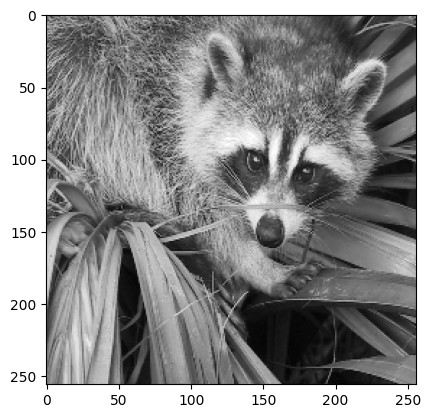

In [37]:
import cv2  # OpenCV pro načítání obrázku
import matplotlib.pyplot as plt
import numpy as np
# Načtení obrázku a konverze do odstínů šedi
imgbw2 = cv2.imread("tmp/myval.jpg", cv2.IMREAD_GRAYSCALE)     # načte obrázek
imgbw2 = cv2.resize(imgbw2, (256, 256))                         # přizpůsobí velikost
plt.imshow(imgbw2, cmap="gray")
plt.show()

Jiný obrázek

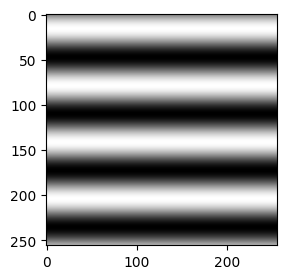

In [20]:
# Vytvoření low-pass filtru
def vytvorObraz(om):
    rows, cols = 256, 256

    # Vytvoříme masku (low-pass filtr)
    img = np.zeros((rows, cols))
    for i in range(0, rows):
        img[i, ] = np.sin(om*i)
    return img

def vytvorObraz2(om):
    rows, cols = 256, 256
    x = np.arange(0, cols)
    #img = np.sin(om*x)[None, :] + np.sin(x)[:, None]
    #img = np.sin(om*x)[None, :] * np.ones((rows, 1))
    img = np.sin(om*x)[:, None] * np.ones((1, cols))
    return img

# Velikost okna pro low-pass filtr (poloměr, kolik frekvencí necháme projít)
imgbw2 = vytvorObraz2(0.1)     # default 0.1
plt.figure(figsize=(3,3))
plt.imshow(imgbw2, cmap="gray")
plt.show()

Aplikace Fourierovy transformace na obrázek

[[ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]


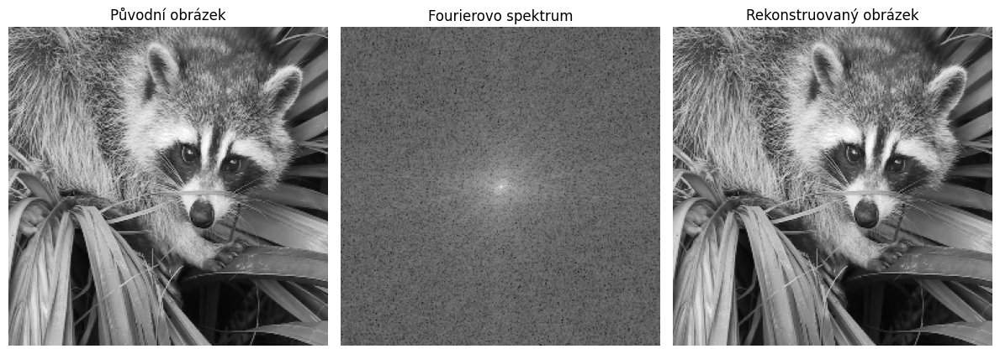

In [38]:
# Fourierova transformace pomocí NumPy nebo SciPy (novější a optimalizovanější)
import numpy as np
import matplotlib.pyplot as plt
#from numpy.fft import fft2, ifft2, fftshift, ifftshift
from scipy.fft import fft2, ifft2, fftshift, ifftshift

img = imgbw2
# 2D Fourierova transformace obrázku
f_transform = fft2(img)

# Posunutí nulové frekvence do středu (vizualizace)
f_transform_shifted = fftshift(f_transform)
f_ishift = ifftshift(f_transform_shifted)           # inverzní fce (pro případ potřeby)
print(f_ishift==f_transform) 

# Magnituda spektra (pro vizualizaci) - logaritmické měřítko (FFT spektrum mívá široký dynamický rozsah)
magnitude_spectrum = np.log(np.abs(f_transform_shifted) + 1)

# Inverzní Fourierova transformace (po rekonstrukci obrazu)
img_reconstructed = np.real(ifft2(f_transform))
#img_reconstructed = np.abs(ifft2(ifftshift(f_transform_shifted)))

# Vizualizace
plt.figure(figsize=(12, 6))

# Zobrazení původního obrázku
plt.subplot(1, 3, 1)                # 1 řádek, 3 sloupce, první
plt.title("Původní obrázek")
plt.imshow(img, cmap="gray")
plt.axis("off")

# Zobrazení magnitude spektra
plt.subplot(1, 3, 2)                # 1 řádek, 3 sloupce, druhý
plt.title("Fourierovo spektrum")
plt.imshow(magnitude_spectrum, cmap="gray")
plt.axis("off")

# Zobrazení rekonstruovaného obrázku
plt.subplot(1, 3, 3)                # 1 řádek, 3 sloupce, třetí
plt.title("Rekonstruovaný obrázek")
plt.imshow(img_reconstructed, cmap="gray")
plt.axis("off")

plt.tight_layout()
plt.show()


Vytvoření low-pass filtru

(256, 256)


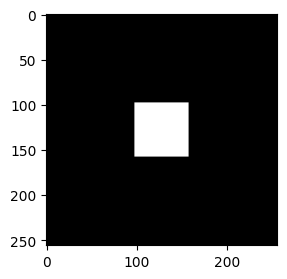

In [22]:
# Vytvoření low-pass filtru
def vytvorFiltr(radius):
    rows, cols = img.shape
    crow, ccol = rows // 2, cols // 2  # Střed obrázku (nulová frekvence)

    # Vytvoříme masku (low-pass filtr)
    mask = np.zeros((rows, cols))
    mask[crow - radius:crow + radius, ccol - radius:ccol + radius] = 1
    return mask

# Velikost okna pro low-pass filtr (poloměr, kolik frekvencí necháme projít)
mask = vytvorFiltr(30)     # default 30
print(img.shape)
plt.figure(figsize=(3,3))
plt.imshow(mask, cmap="gray")
plt.show()

Krok 1: Fourierova transformace původního obrazu

In [39]:
# Fourierova transformace a low-pass filtr
import numpy as np
import matplotlib.pyplot as plt
#from numpy.fft import fft2, ifft2, fftshift, ifftshift
from scipy.fft import fft2, ifft2, fftshift, ifftshift

img = imgbw2
# 2D Fourierova transformace obrázku
f_transform = fft2(img)

# Posunutí nulové frekvence do středu (vizualizace)
f_transform_shifted = fftshift(f_transform)
f_transform_filtered = f_transform_shifted      # pouze pro případ, že se nespustí další buňka

Krok 2: Aplikace masky na spektrum

In [42]:
mask = vytvorFiltr(50)
# low-pass filtr
f_transform_filtered = f_transform_shifted * mask
# high-pass filtr
#f_transform_filtered = f_transform_shifted * (1-mask)

Krok 3: Inverzní transformace a vizualizace

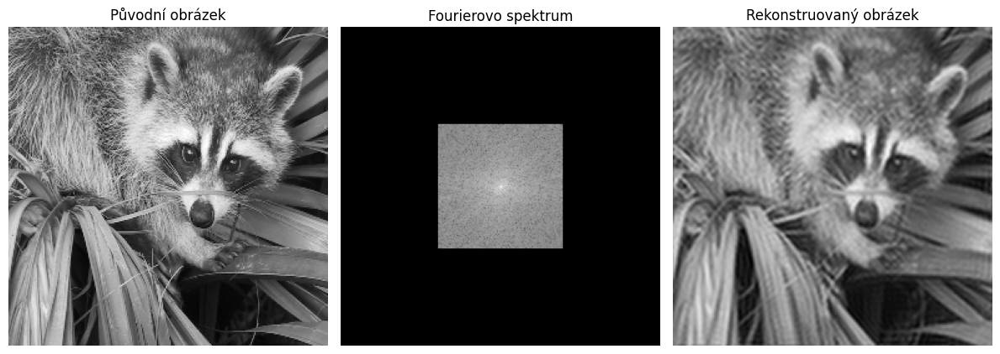

In [43]:
# Magnituda spektra (pro vizualizaci) - logaritmické měřítko
magnitude_spectrum = np.log(np.abs(f_transform_filtered) + 1)

f_ishift = ifftshift(f_transform_filtered)           # inverzní fce k fftshift - zde nutná

# Inverzní Fourierova transformace (po rekonstrukci obrazu)
img_reconstructed = np.real(ifft2(f_ishift))

# Vizualizace
plt.figure(figsize=(12, 6))

# Zobrazení původního obrázku
plt.subplot(1, 3, 1)                # 1 řádek, 3 sloupce, první
plt.title("Původní obrázek")
plt.imshow(img, cmap="gray")
plt.axis("off")

# Zobrazení magnitude spektra
plt.subplot(1, 3, 2)                # 1 řádek, 3 sloupce, druhý
plt.title("Fourierovo spektrum")
plt.imshow(magnitude_spectrum, cmap="gray")
plt.axis("off")

# Zobrazení rekonstruovaného obrázku
plt.subplot(1, 3, 3)                # 1 řádek, 3 sloupce, třetí
plt.title("Rekonstruovaný obrázek")
plt.imshow(img_reconstructed, cmap="gray")
plt.axis("off")

plt.tight_layout()
plt.show()

Okénková FT (STFT)

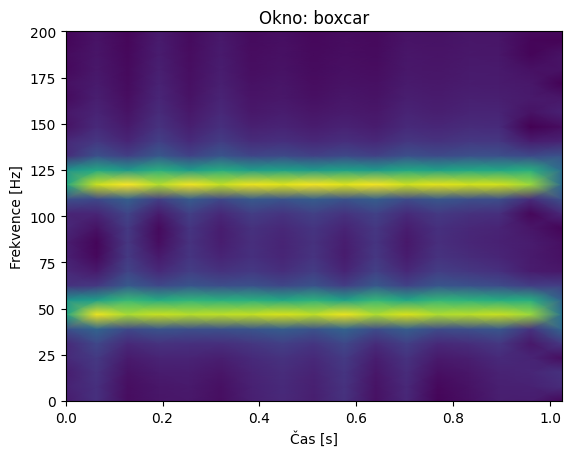

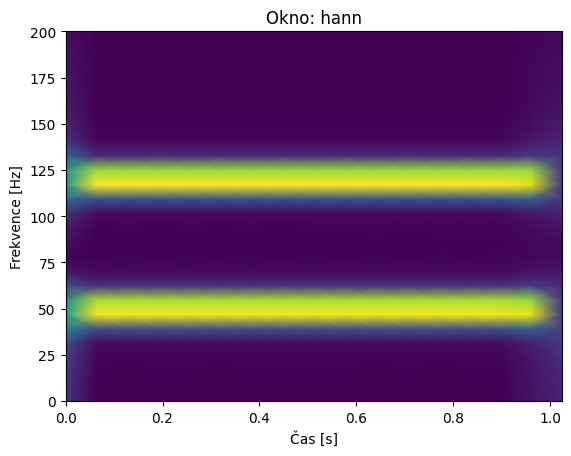

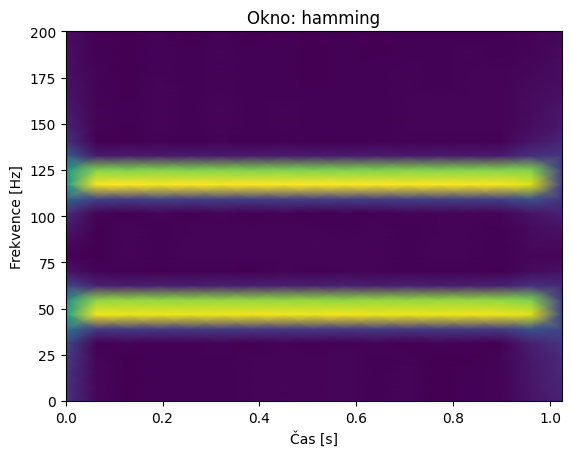

In [8]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import get_window, stft

fs = 1000
t = np.linspace(0, 1, fs)
x = np.sin(2*np.pi*50*t) + np.sin(2*np.pi*120*t)

for win_name in ['boxcar', 'hann', 'hamming']:
    f, tt, Z = stft(x, fs=fs, window=win_name, nperseg=128)
    plt.figure()
    plt.title(f"Okno: {win_name}")
    plt.pcolormesh(tt, f, np.abs(Z), shading='gouraud')
    plt.ylim(0, 200)
    plt.ylabel("Frekvence [Hz]")
    plt.xlabel("Čas [s]")
plt.show()


## 2D Waveletová transformace

Rozkládá vstupní obraz na 4 složky (LL, LH, HL, HH)

(LL, (LH, HL, HH))      &emsp; &emsp; n-tice

(cA, (cH, cV, cD))      &emsp; &emsp; jiné označení

----
LL (Low-Low) 
- cA Aproximace
- nízké frekvence

HL (High-Low) 
- cH horizontální detaily (hrany)

LH (Low-High) 
- cV svislé detaily (hrany)

HH (High-High) 
- cD diagonální detaily
- vysoké frekvence

#### dwt2
Jeden krok DWT rozkladu – rozdělí obrázek na čtyři sub-pásma (LL, LH, HL, HH) pro jednu úroveň
- vrací (LL, (LH, HL, HH))
#### wavedec2
Víceúrovňový DWT rozklad – opakuje dwt2 na nízkofrekvenční složce (LL) až do zadané úrovně
- vrací [LL, (LH, HL, HH), (LH, HL, HH), ...]
  - LL pouze poslední úrovně
  - n-tice (LH, HL, HH) od poslední úrovně k první

In [ ]:
%pip install pywavelets

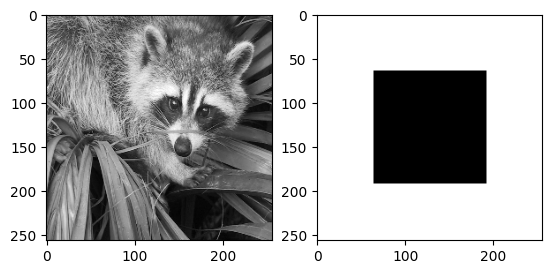

In [17]:
import numpy as np
import matplotlib.pyplot as plt

# Načtení obrázku
img1 = imgbw2

# Načtení testovacího obrazu
img2 = np.ones((256, 256))
img2[64:192, 64:192] = 0

plt.subplot(1, 2, 1)            # 1 řádek, 2 sloupce, první
plt.imshow(img1, cmap="gray")
plt.subplot(1, 2, 2)            # 1 řádek, 2 sloupce, druhý
plt.imshow(img2, cmap="gray")
plt.show()

### Jednoúrovňová DWT
#### DWT2 - 2D diskrétní waveletová transformace



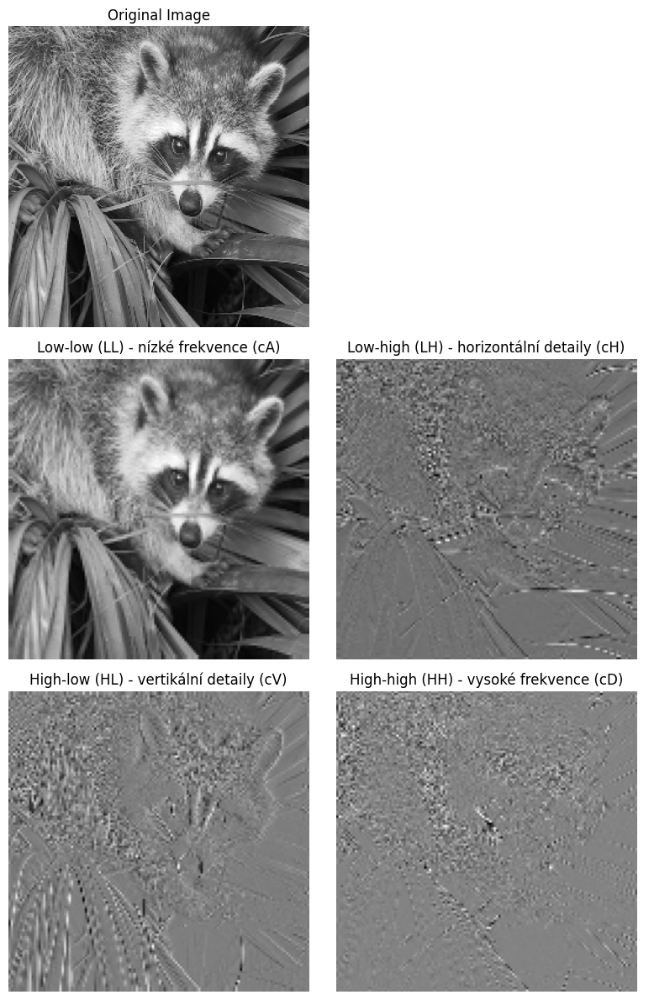

In [18]:
# Waveletová transformace, pywt
import pywt
#import pywt.data

image = img1

# Aplikace diskrétní waveletové transformace
coeffs2 = pywt.dwt2(image, 'bior1.3')  # 'bior1.3' je typ waveletu
LL, (LH, HL, HH) = coeffs2
# cA, (cH, cV, cD)

# Zobrazení spektra koeficientů
fig, axs = plt.subplots(3, 2, figsize=(8, 12))

# Zobrazení původního obrazu
axs[0, 0].imshow(image, cmap='gray')
axs[0, 0].set_title("Original Image")
axs[0, 0].axis('off')

axs[0, 1].axis('off')

# Zobrazení koeficientů LL, LH, HL, HH
axs[1, 0].imshow(LL, cmap='gray')
axs[1, 0].set_title("Low-low (LL) - nízké frekvence (cA)")
axs[1, 0].axis('off')

axs[1, 1].imshow(LH, cmap='gray')
axs[1, 1].set_title("Low-high (LH) - horizontální detaily (cH)")
axs[1, 1].axis('off')

axs[2, 0].imshow(HL, cmap='gray')
axs[2, 0].set_title("High-low (HL) - vertikální detaily (cV)")
axs[2, 0].axis('off')

axs[2, 1].imshow(HH, cmap='gray')
axs[2, 1].set_title("High-high (HH) - vysoké frekvence (cD)")
axs[2, 1].axis('off')

plt.tight_layout()
plt.show()


Úprava složek

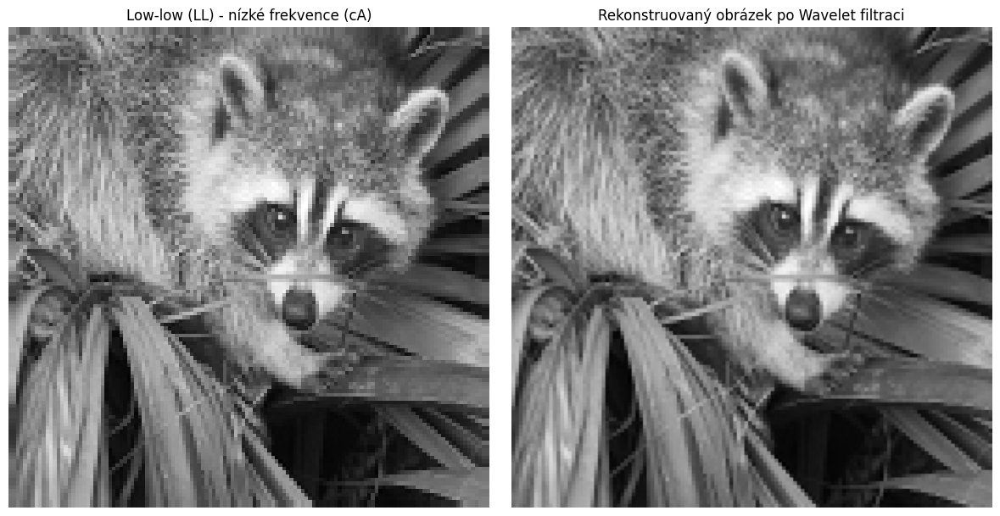

In [ ]:
# Aplikace low-pass filtru: Nastavení detailních koeficientů na nulu
import copy
coeffs_copy = copy.deepcopy(coeffs2)            # kopie celé struktury
LL, (LH, HL, HH) = coeffs_copy
# Tímto odstraníme vysokofrekvenční detaily z (LH, HL, HH)
koef = 10
LH[:,:] /= koef        # nebo např. = 0
HL[:,:] /= koef
HH[:,:] /= koef
#LL[:,:] /= koef
LH=np.round(LH)
HL=np.round(HL)
HH=np.round(HH)
#LL=np.round(LL)
#print(LH)

# Rekonstrukce obrazu po aplikaci filtru
coeffs2_filtered = LL, (LH, HL, HH)
img_reconstructed_filtered = pywt.idwt2(coeffs2_filtered, 'bior1.3')

# Vizualizace
fig, axs = plt.subplots(1, 2, figsize=(12, 6))
plt.subplot(1, 2, 1)                # 1 řádek, 2 sloupce, první
plt.title("Low-low (LL) - nízké frekvence (cA)")
plt.imshow(LL, cmap="gray")
#plt.imshow(image, cmap="gray")
plt.axis("off")

# Zobrazení rekonstruovaného obrázku
plt.subplot(1, 2, 2)                # 1 řádek, 2 sloupce, druhý
plt.imshow(img_reconstructed_filtered, cmap='gray')
plt.title("Rekonstruovaný obrázek po Wavelet filtraci")
plt.axis('off')
plt.tight_layout()
plt.show()


### Víceúrovňová DWT
DWT2, více aplikací

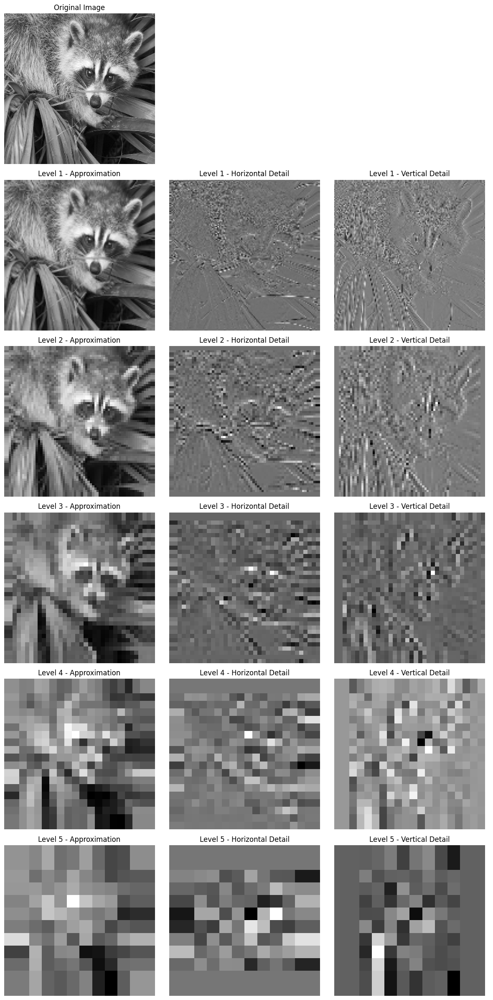

In [178]:
# Waveletová transformace, pywt
import pywt

# Načtení testovacího obrazu
image = img1

# Zvolení waveletu a "hloubky" dekompozice
wavelet_type = 'bior1.3'    # Můžeme změnit na jiný wavelet
max_level = 5               # Maximální úroveň dekompozice

# Aplikace DWT
coeffs = []
current_image = image

# Dekompozice po úrovních
for level in range(max_level):
    coeff = pywt.dwt2(current_image, wavelet_type)
    coeffs.append(coeff)
    current_image = coeff[0]  # Koeficienty nízké frekvence pro další úroveň

# Zobrazení výsledků
fig, axs = plt.subplots(max_level+1, 3, figsize=(12, 4*(max_level+1)))

# Zobrazení původního obrazu
axs[0, 0].imshow(image, cmap='gray')
axs[0, 0].set_title("Original Image")
axs[0, 0].axis('off')
axs[0, 1].axis('off')
axs[0, 2].axis('off')

for i in range(max_level):          # řádky
    cA, (cH, cV, cD) = coeffs[i]
    axs[i+1, 0].imshow(cA, cmap='gray')
    axs[i+1, 0].set_title(f"Level {i+1} - Approximation")
    axs[i+1, 0].axis('off')
    
    axs[i+1, 1].imshow(cH, cmap='gray')
    axs[i+1, 1].set_title(f"Level {i+1} - Horizontal Detail")
    axs[i+1, 1].axis('off')

    axs[i+1, 2].imshow(cV, cmap='gray')
    axs[i+1, 2].set_title(f"Level {i+1} - Vertical Detail")
    axs[i+1, 2].axis('off')

plt.tight_layout()
plt.show()


#### wavedec2
dekompozice pomocí wavedec2 na více úrovních:
- level 1 nejvíce zjednodušený obraz - výsledek první dekompozice 

- vyšší úrovně obsahují stále jemnější detaily

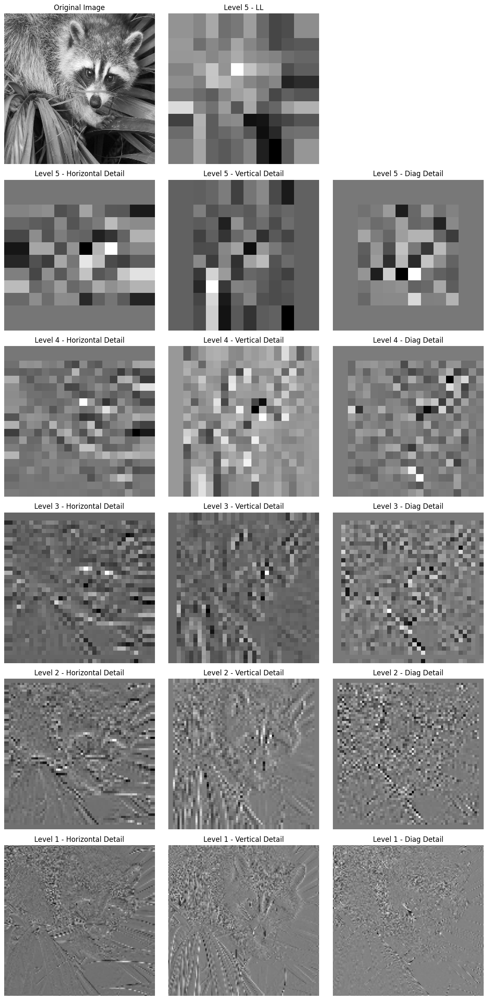

In [24]:
# Waveletová transformace, pywt
import pywt

image = img1

# Parametry DWT: typ waveletu a úroveň dekompozice
wavelet_type = 'bior1.3'        # možno změnit na jiný wavelet
level = 5                       # úroveň dekompozice

# Aplikace DWT s parametry
coeffs = pywt.wavedec2(image, wavelet_type, level=level)
LL = coeffs[0]

# Zobrazení výsledků
fig, axs = plt.subplots(level + 1, 3, figsize=(12, 4*(level+1)))

# Zobrazení původního obrazu
axs[0, 0].imshow(image, cmap='gray')
axs[0, 0].set_title("Original Image")
axs[0, 0].axis('off')

axs[0, 1].imshow(LL, cmap='gray')
axs[0, 1].set_title(f"Level {level} - LL")
axs[0, 1].axis('off')

axs[0, 1].axis('off')
axs[0, 2].axis('off')

# Zobrazení koeficientů pro jednotlivé úrovně
for i in range(level):
    cH, cV, cD = coeffs[i + 1]

    axs[i + 1, 0].imshow(cH, cmap='gray')
    axs[i + 1, 0].set_title(f"Level {level-i} - Horizontal Detail")
    axs[i + 1, 0].axis('off')

    axs[i + 1, 1].imshow(cV, cmap='gray')
    axs[i + 1, 1].set_title(f"Level {level-i} - Vertical Detail")
    axs[i + 1, 1].axis('off')

    axs[i + 1, 2].imshow(cD, cmap='gray')
    axs[i + 1, 2].set_title(f"Level {level-i} - Diag Detail")
    axs[i + 1, 2].axis('off')

plt.tight_layout()
plt.show()


## Zpracovnání obrazu

In [ ]:
from scipy import ndimage
import matplotlib.pyplot as plt
import cv2

Geometrické úpravy

In [234]:
img = iio.imread("tmp/myval.jpg")
#img = img[:, :, 0]                           # jen 1 barevný kanál
sample = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) # stupně šedi
sample = cv2.resize(sample, (150, 150))         # přizpůsobí velikost

samples = [sample]                              # seznam obrázků
titles = ["original"]                           # seznam nadpisů

samples.append(ndimage.shift(sample, (30, 10))) # shora, zdola
titles.append("shift")

samples.append(ndimage.shift(sample, (30, 20), mode='nearest'))
titles.append("shift nearest")

samples.append(ndimage.rotate(sample, 15))      # o 15 stupňů
titles.append("rotate")

samples.append(sample[40:-40, 40:-40])          # 40 pixelů z každé strany
titles.append("crop")

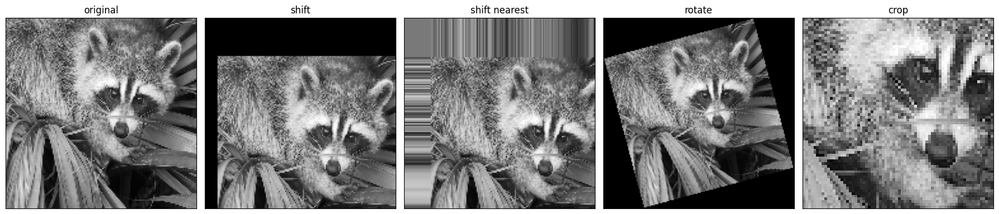

In [359]:
fig, axes = plt.subplots(1, len(samples), figsize=(18,6))
for ax, im, tit in zip(axes, samples, titles):
    ax.imshow(im, cmap=plt.cm.gray)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(tit)
plt.tight_layout()


Odstraňování šumu

In [361]:
from scipy import signal
import numpy as np

noisy_sample = sample.copy().astype(np.float64)
noisy_sample += sample.std() * 0.75 * np.random.standard_normal(sample.shape)

samples = [sample, noisy_sample]
titles = ["original", "noisy"]

samples.append(ndimage.gaussian_filter(noisy_sample, sigma=3))
titles.append("gaussian filter")

samples.append(ndimage.median_filter(noisy_sample, size=5))
titles.append("median filter")

samples.append(signal.wiener(noisy_sample, (5,5)))
titles.append("wiener filter")

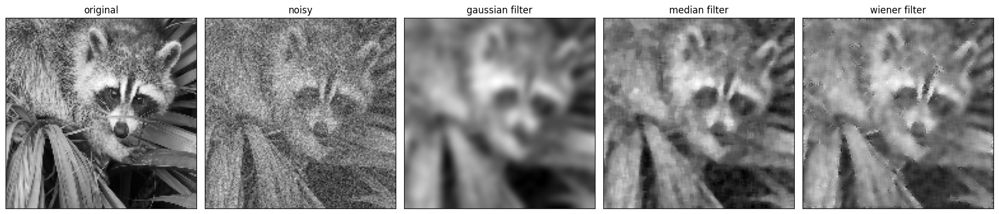

In [362]:
fig, axes = plt.subplots(1, len(samples), figsize=(18,6))
for ax, im, tit in zip(axes, samples, titles):
    ax.imshow(im, cmap=plt.cm.gray)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(tit)
plt.tight_layout()


## Multrezoluční dekompozice obrazu

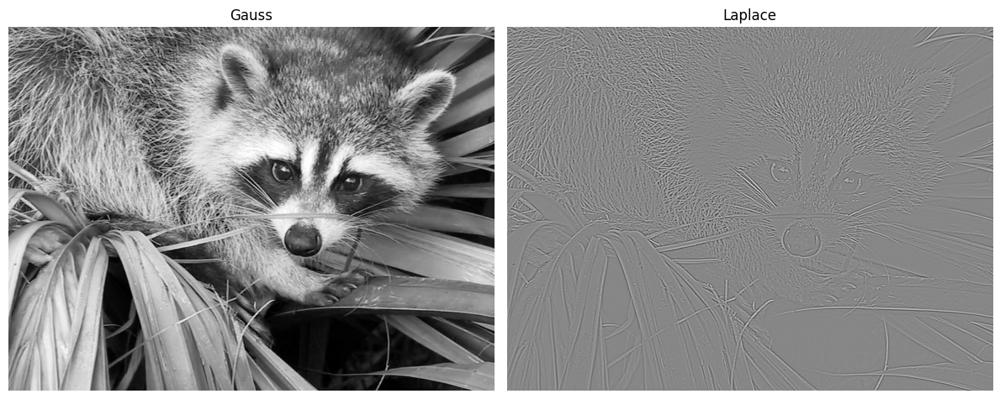

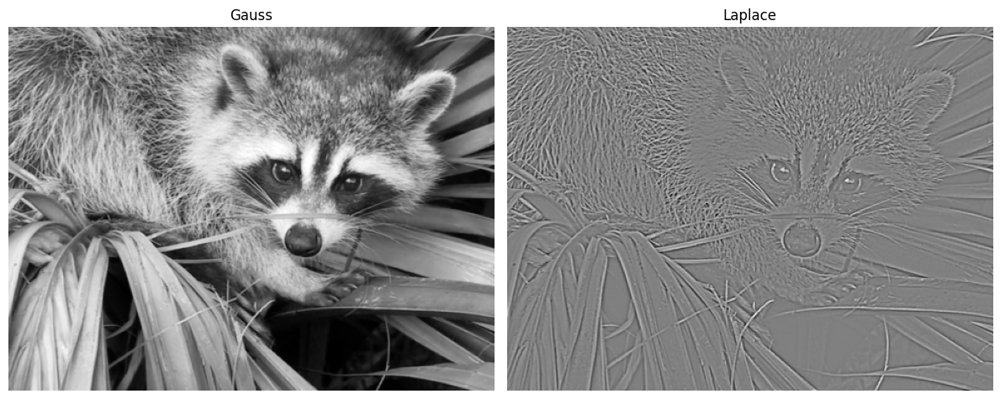

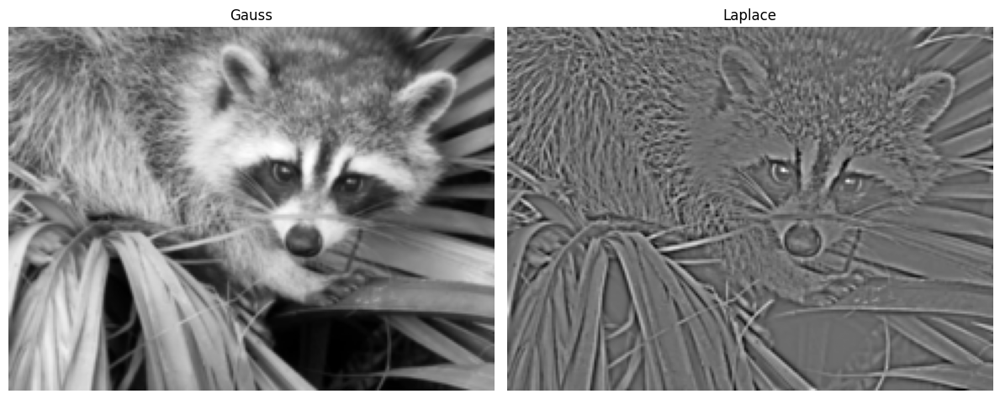

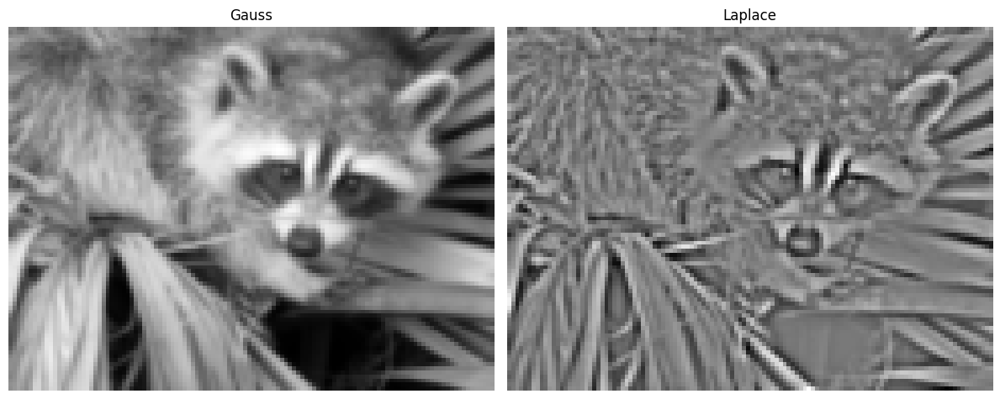

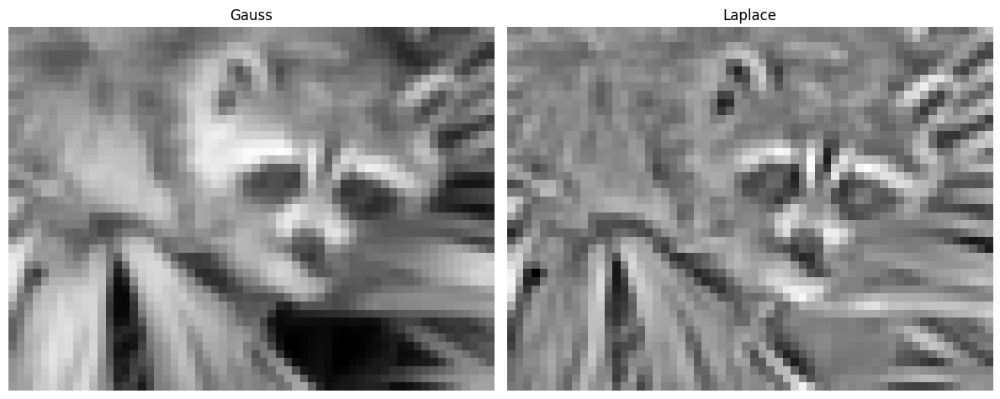

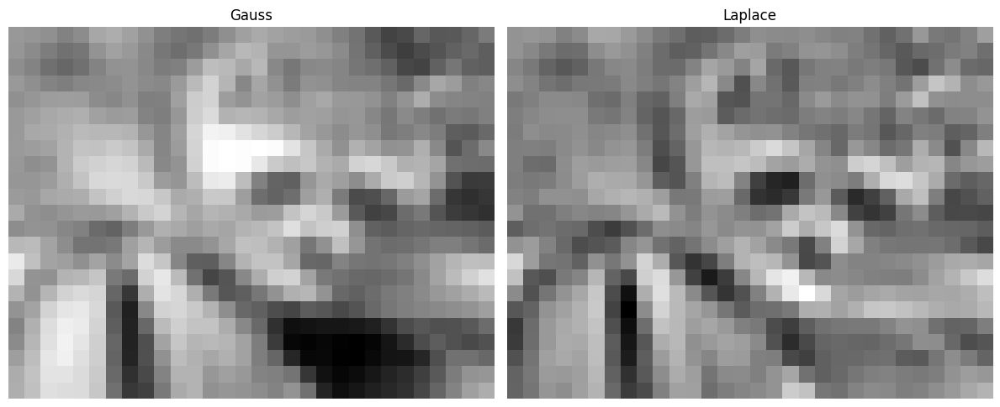

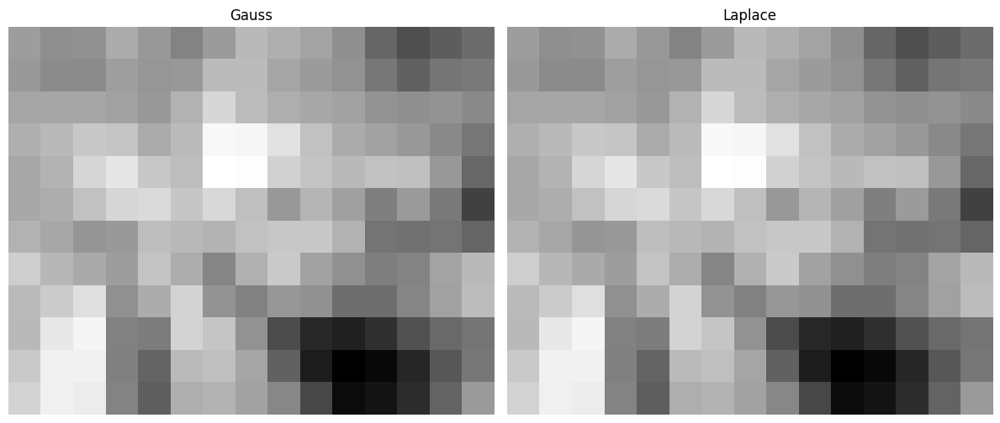

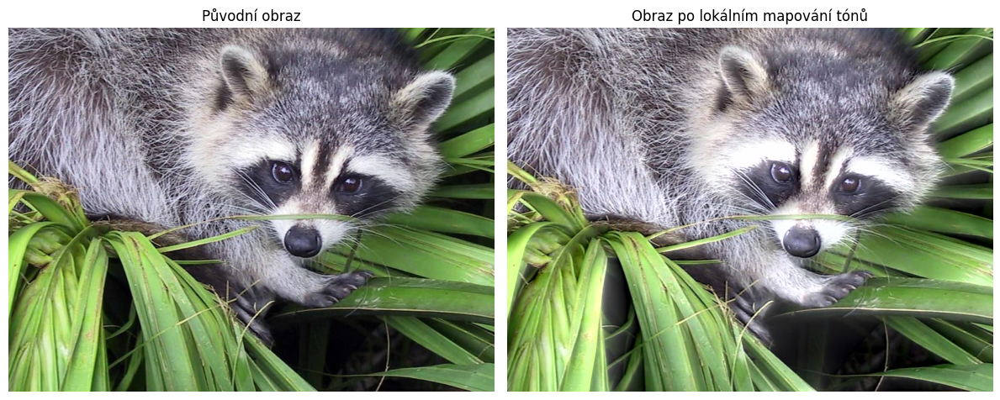

In [235]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from scipy import signal, datasets              # pův. misc

def gaussian_pyramid(img, levels):              # vytváří seznam, první prvek pův. obrázek
    """Vytvoří Gaussovu pyramidu obrazu"""
    G = img.copy()
    gpyramid = [G]
    for i in range(levels):
        G = cv2.pyrDown(G)                      # downsampling, zmenšení matice na 1/4
        gpyramid.append(G)
    return gpyramid

def laplacian_pyramid(gpyramid):
    """Vytvoří Laplaceovu pyramidu z Gaussovy pyramidy"""
    lpyramid = []
    for i in range(len(gpyramid)-1):
        GE = cv2.pyrUp(gpyramid[i+1])           # zvětšení obrazu; doplnění sudými řádky a sloupci a konvoluce
        h, w = gpyramid[i].shape[:2]            # zajistíme, že rozměry souhlasí
        GE = cv2.resize(GE, (w, h))
        L = cv2.subtract(gpyramid[i], GE)       # rozdíl gpyramid[i] - zvětšená(gpyramid[i+1])
        #L *= 8
        lpyramid.append(L)                      # aktuální úroveň do seznamu

    lpyramid.append(gpyramid[-1])               # poslední úroveň gaussovské pyramidy do seznamu

    return lpyramid

def zobraz_pyramidy(gpyramid, lpyramid):        # vizualizace
    for i in range(len(gpyramid)):
        # Vizualizace
        plt.figure(figsize = (12, 6))
        plt.subplot(121)
        plt.title('Gauss')
        plt.imshow(gpyramid[i], cmap="gray")
        plt.axis('off')
        plt.subplot(122)
        plt.title('Laplace')
        plt.imshow(lpyramid[i], cmap="gray")
        plt.axis('off')
        plt.tight_layout()
        plt.show()


def tone_mapping_operator(value, max_value, compression_factor=0.5):
    """Jednoduchý operátor pro mapování tónů - logaritmická komprese"""
    return np.log1p(compression_factor * value) / np.log1p(compression_factor * max_value)

def local_tone_mapping(img, levels=4, compression_factor=0.5):
    """Provede lokální mapování tónů pomocí multirezoluční dekompozice"""
    img_float = img.astype(np.float32) / 255.0                  # převedení na float pro výpočty
    
    # Barevný obraz **********************************
    if len(img_float.shape) == 3:                               # zpracujeme pouze jasovou složku
        
        img_lab = cv2.cvtColor(img_float, cv2.COLOR_BGR2LAB)    # převod do LAB barevného prostoru
        L_channel = img_lab[:,:,0] / 100.0                      # normalizace L kanálu na rozsah 0-1
         
        gpyramid = gaussian_pyramid(L_channel, levels)          # vytvoření pyramidy pro jasovou složku
        lpyramid = laplacian_pyramid(gpyramid)
        zobraz_pyramidy(gpyramid, lpyramid)


        mapped_lpyramid = []                                    # mapování tónů na každou úroveň Laplaceovy pyramidy
        for i in range(len(lpyramid)):
            max_val = np.max(np.abs(lpyramid[i]))
            if max_val > 0:
                
                if i < len(lpyramid) - 1:                       # pro detaily (Laplacian) zachováme kontrast
                    detail_gain = 1.0
                    mapped = lpyramid[i] * detail_gain
                else:                                           # pro základní úroveň použijeme mapování tónů
                    mapped = tone_mapping_operator(lpyramid[i], 1.0, compression_factor)
                
                mapped_lpyramid.append(mapped)
            else:
                mapped_lpyramid.append(lpyramid[i])

        reconstructed = mapped_lpyramid[-1].copy()              # rekonstrukce obrazu z upravené pyramidy
        for i in range(len(mapped_lpyramid)-2, -1, -1):
            h, w = mapped_lpyramid[i].shape[:2]
            reconstructed = cv2.resize(reconstructed, (w, h))
            
            reconstructed = reconstructed.astype(np.float32)    # zajistíme, že oba vstupy mají stejný datový typ pro cv2.add
            current_level = mapped_lpyramid[i].astype(np.float32)
            reconstructed = reconstructed + current_level       # použijeme numpy místo cv2.add (pro vyhnutí se typovým problémům)
        
        
        reconstructed = np.clip(reconstructed, 0, 1)            # omezení hodnot na rozsah 0-1
         
        img_lab[:,:,0] = reconstructed * 100.0                  # vrátíme upravený L kanál zpět do LAB obrazu
        result = cv2.cvtColor(img_lab, cv2.COLOR_LAB2BGR)
        
    # Černobílý obraz **********************************
    else:                                                       # černobílý obraz
        gpyramid = gaussian_pyramid(img_float, levels)
        lpyramid = laplacian_pyramid(gpyramid)
        
        mapped_lpyramid = []                                    # mapování tónů
        for i in range(len(lpyramid)):
            max_val = np.max(np.abs(lpyramid[i]))
            if max_val > 0:
                if i < len(lpyramid) - 1:
                    detail_gain = 1.0
                    mapped = lpyramid[i] * detail_gain
                else:
                    mapped = tone_mapping_operator(lpyramid[i], 1.0, compression_factor)
                mapped_lpyramid.append(mapped)
            else:
                mapped_lpyramid.append(lpyramid[i])
        
        result = mapped_lpyramid[-1].copy()                     # rekonstrukce obrazu
        for i in range(len(mapped_lpyramid)-2, -1, -1):
            h, w = mapped_lpyramid[i].shape[:2]
            result = cv2.resize(result, (w, h))
            # Zajistíme, že oba vstupy mají stejný datový typ
            result = result.astype(np.float32)
            current_level = mapped_lpyramid[i].astype(np.float32)
            # Použijeme numpy místo cv2.add
            result = result + current_level
        
        result = np.clip(result, 0, 1)                          # omezení hodnot
    
    return (result * 255).astype(np.uint8)                      # převod zpět na uint8


# ***** Ukázka použití ******************************************************
def demonstrate_tone_mapping():

    # Načtení HDR obrazu, nebo simulace HDR pomocí normálního obrazu
    try:
        # Pokus o načtení HDR obrazu, pokud je k dispozici
        #img = cv2.imread('a.jpg', cv2.IMREAD_UNCHANGED)
        img = datasets.face()                  # obrázek mývala 1024 x 768
    except:
        # Jinak použijeme běžný obraz
        img = cv2.imread('image.jpg')
    
    if img is None:
        # Vytvoříme syntetický obraz s vysokým dynamickým rozsahem
        h, w = 512, 512
        img = np.zeros((h, w, 3), dtype=np.uint8)
        
        # Vytvoření gradientu
        for i in range(h):
            for j in range(w):
                distance = np.sqrt((i - h/2)**2 + (j - w/2)**2)
                value = int(255 * (1 - distance / (h/2)))
                value = max(0, min(255, value))
                img[i, j] = [value, value, value]
        
        # Přidání několika jasných oblastí
        cv2.circle(img, (int(w/4), int(h/4)), 50, (255, 255, 255), -1)
        cv2.circle(img, (int(3*w/4), int(3*h/4)), 70, (255, 255, 255), -1)
    
    # Aplikace lokálního mapování tónů
    result = local_tone_mapping(img, levels=6, compression_factor=0.7)     # levels: 4, , compression: 0.7
    
    # Zobrazení výsledků
    plt.figure(figsize=(12, 6))
    
    plt.subplot(121)
    plt.title('Původní obraz')
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    
    plt.subplot(122)
    plt.title('Obraz po lokálním mapování tónů')
    plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()

if __name__ == "__main__":
    demonstrate_tone_mapping()